In [1]:
from src.data_loader import get_combined_data, data_preprocessing, enrich_data

from src.classes.EMBEDDING_SEQ_CLUSTER_class import EMBEDDING_SEQ_CLUSTER
from src.classes.COMBINED_DYAD_YEAR_SEQ_CLUSTER_class import COMBINED_DYAD_YEAR_SEQ_CLUSTER
from src.classes.DYAD_YEAR_SEQ_CLUSTER_class import DYAD_YEAR_SEQ_CLUSTER
from src.classes.HDBSCAN_SEQ_CLUSTER_class import HDBSCAN_SEQ_CLUSTER

from src.classes.CLUSTER_SEQ_COMPARISON_class import CLUSTER_SEQ_COMPARISON

from src.clustering import (build_kmean_cluster, 
                            plot_cluster, 
                            plot_cluster_summary,
                            build_numeric_feature_cluster)

import pandas as pd
import networkx as nx

/Users/luke-liambergmeier/.local/share/virtualenvs/africa_conflict-pdMuXTdf/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 0. Get Data

In [2]:
df = get_combined_data()
df_africa = data_preprocessing(df)

df_africa.head()

,event_id_cnty,event_date,year,time_precision,disorder_type,actor1,actor2,actor1_id,actor2_id,latitude,...,forest_gc,herb_gc,shrub_gc,urban_gc,water_gc,mountains_mean,rainseas,ttime_mean,dist_border_km_2004,dist_capital_km_2004
0,DRC31402,2023-12-31 00:00:00,2023,1,Political violence,Rioters (Democratic Republic of Congo),NaN,00001,00001,-6.1500,...,6.101852,0.317901,5.641975,0.0,0.000000,0.0,11.0,147.50917,197.57076,904.80680
1,BFO11325,2023-12-31 00:00:00,2023,1,Political violence,JNIM: Group for Support of Islam and Muslims,NaN,00002,00002,12.9871,...,0.893855,1.585972,0.117939,0.0,0.080695,0.0,6.0,235.47472,180.74571,94.08883
2,BFO11326,2023-12-31 00:00:00,2023,1,Political violence,JNIM: Group for Support of Islam and Muslims,Military Forces of Burkina Faso (2022-),00002,00024,13.4417,...,5.561729,31.466050,0.000000,0.0,0.027778,0.0,6.0,411.62473,62.89616,215.85773
3,GAB472,2023-12-31 00:00:00,2023,2,Demonstrations,Protesters (Gabon),NaN,00003,00003,0.3901,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GHA2083,2023-12-31 00:00:00,2023,2,Political violence,Rioters (Ghana),NaN,00004,00004,7.7254,...,21.685184,0.000000,21.756172,0.0,32.021606,0.0,6.0,342.38196,35.02734,248.70784


# 1. Build Sequences

### Basic Dyad based Sequences

In [3]:
dyad_year_seq_cluster = DYAD_YEAR_SEQ_CLUSTER(df_africa)
dyad_year_sequences= dyad_year_seq_cluster.extract_sequences(df_africa, index = 'month_year')

In [4]:
dyad_year_seq_cluster.describe_sequences()

Sequence Overview
Total sequences:                    1242
Events in a sequence:               200334
Events not in a sequence:           197604 (min events: 10)

----------------------------------------
Sequence Length (Number of Events)
----------------------------------------
Mean       161.30
Std        397.82
Min        10
Max        4730

----------------------------------------
Sequence Duration (Index: month_year)
----------------------------------------
Mean       4.12
Std        5.30
Min        0.00
Max        26.91

----------------------------------------
Metric Distribution Summary
----------------------------------------
event_id_cnty (count):
  Mean     5.6606
  Std      10.9833
  Min      1.1111
  Max      304.1111

latitude (mean):
  Mean     8.3160
  Std      10.8100
  Min      -29.3058
  Max      36.5220

longitude (mean):
  Mean     22.4543
  Std      15.3149
  Min      -16.3058
  Max      49.6057

fatalities (sum):
  Mean     42.0586
  Std      163.1081
  Min      

### Combined Dyad based Sequences

In [5]:
combined_dyad_year_seq_cluster = COMBINED_DYAD_YEAR_SEQ_CLUSTER(df_africa, index = 'month_year')
combined_dyad_year_sequences= combined_dyad_year_seq_cluster.extract_sequences(df_africa)

Total nodes: 19189
Total edges: 5531
Total small sequences in subnetwork: 3097


In [6]:
combined_dyad_year_seq_cluster.describe_sequences()

Sequence Overview
Total sequences:                    1656
Events in a sequence:               272666
Events not in a sequence:           125272 (min events: 10)

----------------------------------------
Sequence Length (Number of Events)
----------------------------------------
Mean       164.65
Std        422.36
Min        10
Max        4836

----------------------------------------
Sequence Duration (Index: month_year)
----------------------------------------
Mean       8.97
Std        7.85
Min        0.00
Max        26.91

----------------------------------------
Metric Distribution Summary
----------------------------------------
event_id_cnty (count):
  Mean     4.0842
  Std      9.5681
  Min      1.0000
  Max      304.1111

latitude (mean):
  Mean     7.5428
  Std      10.5696
  Min      -33.9102
  Max      36.5262

longitude (mean):
  Mean     22.6121
  Std      15.6241
  Min      -16.5732
  Max      49.5894

fatalities (sum):
  Mean     26.2183
  Std      115.8068
  Min      0

In [7]:
# search for spefictic example network
target_actor = ["Rioters (Cameroon)", "Civilians (Nigeria)", "Military Forces of Cameroon (1982-)", "Military Forces of Cameroon (1982-) Gendarmerie", "Unidentified Armed Group (Cameroon)"]
components = list(nx.connected_components(combined_dyad_year_seq_cluster.network))
num_subnet = 0
for i, nodes in enumerate(components):
    subgraph = combined_dyad_year_seq_cluster.network.subgraph(nodes)
    actor_lists = nx.get_node_attributes(subgraph, "actors").values()
    all_actors = [a for sublist in actor_lists for a in sublist if a is not None]
    if all(actor in all_actors for actor in target_actor):
        print(all_actors)
        num = i

[np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Police Forces of Cameroon (1982-) Prison Guards'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Military Forces of Cameroon (1982-) Gendarmerie'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Fulani Ethnic Militia (Nigeria)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Unidentified Armed Group (Cameroon)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Civilians (Cameroon)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Civilians (Nigeria)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Military Forces of Cameroon (1982-) Rapid Intervention Battalion'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Military Forces of Cameroon (1982-)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Police Forces of Cameroon (1982-)'), np.str_('Rioters (Cameroon)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Ambazonian Separatists (Cameroon)'), np.str_('Fulan

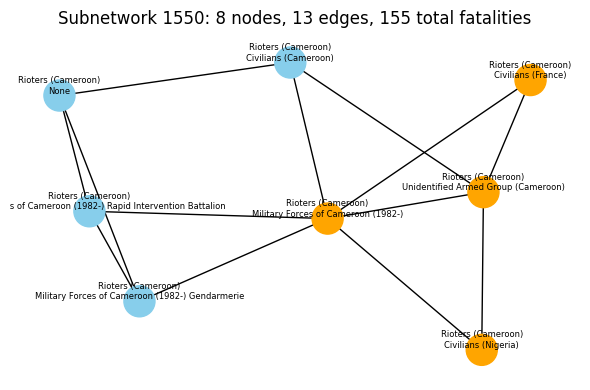

In [8]:
combined_dyad_year_seq_cluster.plot_network(num)

### HDBScan based Sequences encluding Embedding

In [9]:
embedding_seq_cluster = EMBEDDING_SEQ_CLUSTER(df_africa, force_recompute=False, force_recompute_embeddings=False, HDBSCAN_MIN_SEQ_LENGTH=10)
embedding_sequences = embedding_seq_cluster.extract_sequences(df_africa, index='month_year')

Loading existing embeddings from /Users/luke-liambergmeier/Desktop/africa_conflict/data/processed_data/text_embeddings.npy
Loading existing processed data from /Users/luke-liambergmeier/Desktop/africa_conflict/data/processed_data/embedding_data_seq.csv
Some event values are missing in the final mapping index:
[240525 241753 241752 ... 507806 21604 20333]


Sequence Overview
Total sequences:                    3469
Events in a sequence:               157002
Events not in a sequence:           240936 (min events: 10)

----------------------------------------
Sequence Length (Number of Events)
----------------------------------------
Mean       45.26
Std        72.64
Min        10
Max        1242

----------------------------------------
Sequence Duration (Index: month_year)
----------------------------------------
Mean       2.45
Std        2.02
Min        0.00
Max        16.08

----------------------------------------
Metric Distribution Summary
----------------------------------------
event_id_cnty (count):
  Mean     3.1050
  Std      2.4737
  Min      1.0000
  Max      39.2593

latitude (mean):
  Mean     7.6427
  Std      10.7728
  Min      -33.9102
  Max      36.7299

longitude (mean):
  Mean     23.9161
  Std      15.4455
  Min      -16.4977
  Max      49.5754

fatalities (sum):
  Mean     38.2191
  Std      376.7692
  Min      0.51

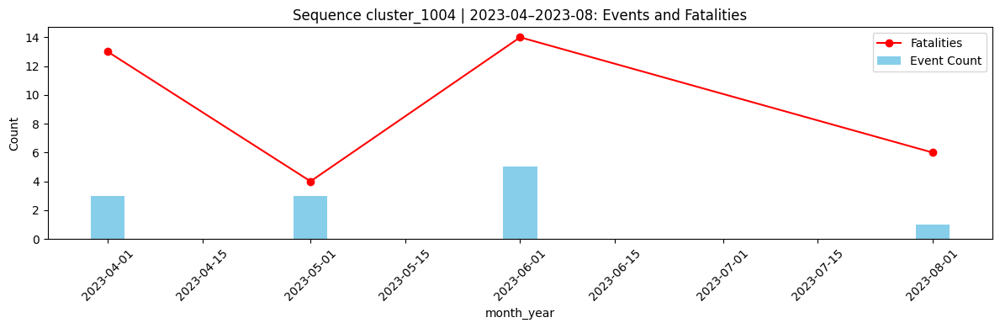

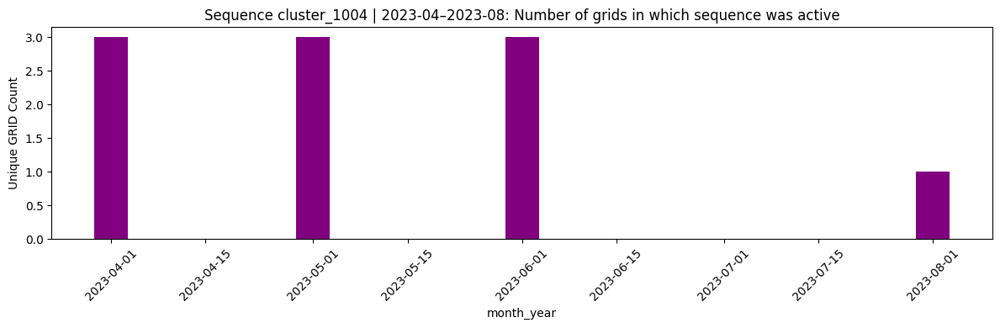

In [10]:
embedding_seq_cluster.describe_sequences()
embedding_seq_cluster.plot_sequence(4)

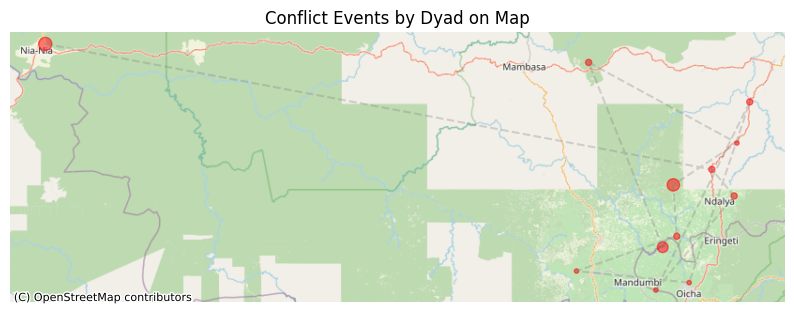

In [11]:
embedding_seq_cluster.plot_map(4, df_africa)

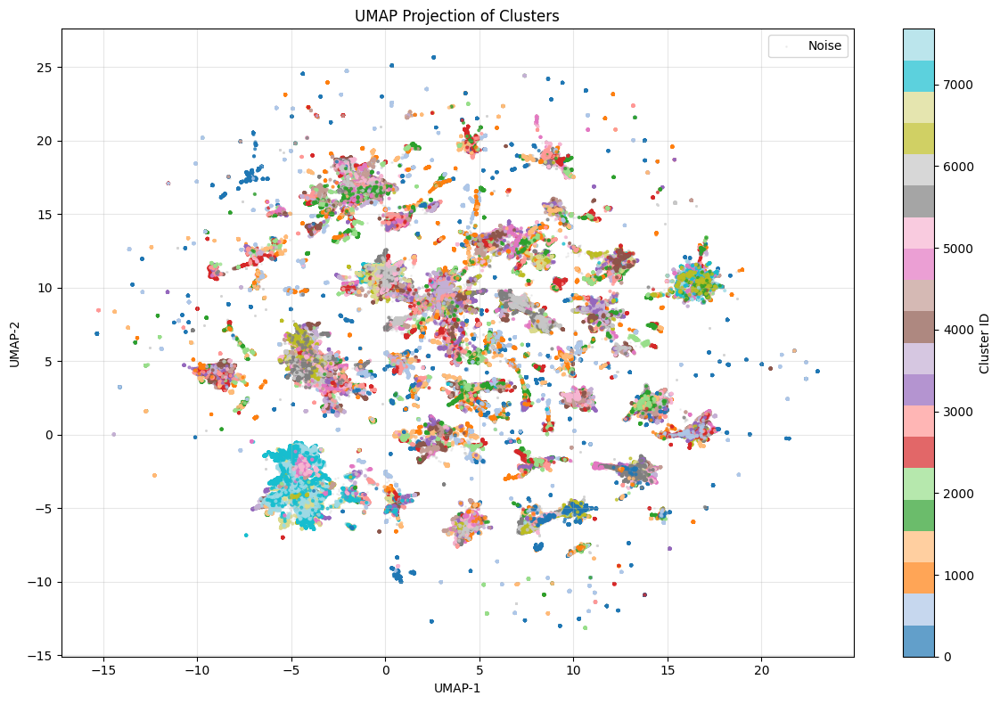

array([[ 0.5135068 , 16.756855  ],
       [ 2.4197922 ,  0.18032314],
       [ 2.406952  , -1.2073517 ],
       ...,
       [-6.707956  , 10.559188  ],
       [ 4.739457  , 19.55995   ],
       [ 4.8101215 , 19.50968   ]], shape=(397938, 2), dtype=float32)

In [12]:
embedding_seq_cluster.plot_umap_clusters()

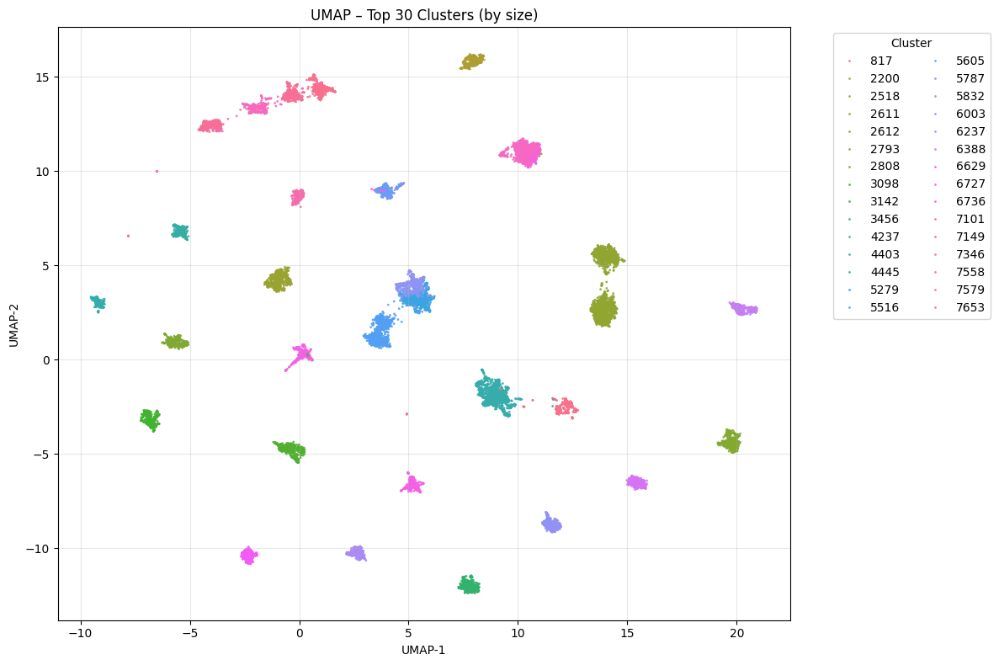

In [13]:
embedding_seq_cluster.plot_top_clusters_umap(top_n=30)

### HDBScan based Sequences 

In [14]:
HDBScan_seq_cluster = HDBSCAN_SEQ_CLUSTER(df_africa, HDBSCAN_MIN_SEQ_LENGTH=10)
HDBScan_sequences = HDBScan_seq_cluster.extract_sequences(df_africa, index='month_year')

Performing HDBSCAN clustering


Sequence Overview
Total sequences:                    3352
Events in a sequence:               127361
Events not in a sequence:           270577 (min events: 10)

----------------------------------------
Sequence Length (Number of Events)
----------------------------------------
Mean       38.00
Std        116.12
Min        10
Max        5385

----------------------------------------
Sequence Duration (Index: month_year)
----------------------------------------
Mean       0.37
Std        0.42
Min        0.00
Max        5.33

----------------------------------------
Metric Distribution Summary
----------------------------------------
event_id_cnty (count):
  Mean     8.4660
  Std      7.3340
  Min      1.3636
  Max      102.0000

latitude (mean):
  Mean     8.0419
  Std      10.1771
  Min      -33.9545
  Max      36.8253

longitude (mean):
  Mean     24.7508
  Std      15.2515
  Min      -16.5713
  Max      49.9891

fatalities (sum):
  Mean     75.7438
  Std      717.0415
  Min      0.7

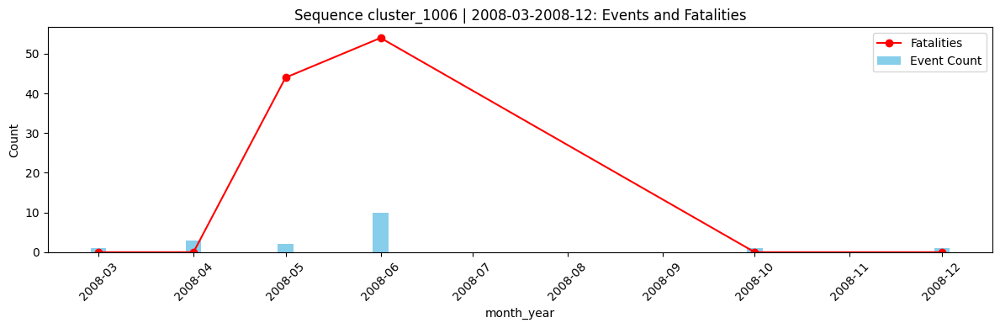

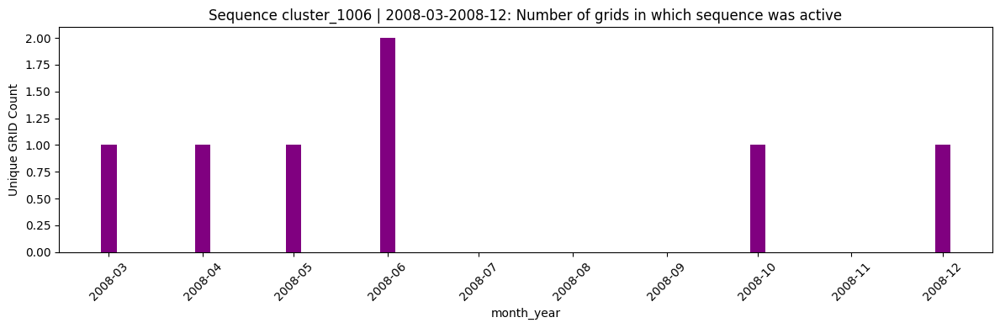

In [15]:
HDBScan_seq_cluster.describe_sequences()

HDBScan_seq_cluster.plot_sequence(2)

# 2. Compare Sequences

In [16]:
comparison = CLUSTER_SEQ_COMPARISON()

# Add clustering methods (only need the cluster objects)
comparison.add_clustering_method("AbCES", dyad_year_seq_cluster)
comparison.add_clustering_method("NAbCES", combined_dyad_year_seq_cluster)
comparison.add_clustering_method("STbCES", HDBScan_seq_cluster)
comparison.add_clustering_method("STSbCES", embedding_seq_cluster)


# TODO: check if same outlier Outlier overlap

Added AbCES: 1242 sequences, 200334 events
Added NAbCES: 1656 sequences, 272666 events
Added STbCES: 3352 sequences, 127361 events
Added STSbCES: 3469 sequences, 157002 events


In [17]:
comparison.print_summary()


CLUSTERING VALIDATION SUMMARY

Noise ratios:
  AbCES: 49.7% (197,604/397,938)
  NAbCES: 31.5% (125,272/397,938)
  STbCES: 68.0% (270,577/397,938)
  STSbCES: 60.5% (240,936/397,938)

CLUSTERING COMPARISON SUMMARY

Method Statistics:
  AbCES: 1242 sequences, 200334 events (avg size: 161.3)
  NAbCES: 1656 sequences, 272666 events (avg size: 164.7)
  STbCES: 3352 sequences, 127361 events (avg size: 38.0)
  STSbCES: 3469 sequences, 157002 events (avg size: 45.3)

Overall Similarity Scores:
  Average ARI: 0.0610
  Average NMI: 0.4842

Adjusted Rand Index (ARI):
  Most similar: AbCES & NAbCES (ARI: 0.1959)
  Least similar: NAbCES & STbCES (ARI: -0.0128)

Normalized Mutual Information (NMI):
  Most similar: AbCES & NAbCES (NMI: 0.8085)
  Least similar: STbCES & STSbCES (NMI: 0.3370)

ADJUSTED RAND INDEX SIMILARITY MATRIX
            AbCES       NAbCES      STbCES      STSbCES     
AbCES             1.0000      0.1959      0.0397      0.1208
NAbCES            0.1959      1.0000     -0.0128    

{'validation': {'event_counts': {'AbCES': 397938,
   'NAbCES': 397938,
   'STbCES': 397938,
   'STSbCES': 397938},
  'common_events': 390178,
  'common_ratio': 0.9804994747925556,
  'method_only_events': {'AbCES': 0,
   'NAbCES': 0,
   'STbCES': 0,
   'STSbCES': 7760},
  'noise_statistics': {'AbCES': {'total': 397938,
    'noise': 197604,
    'noise_ratio': 0.49656981740874206},
   'NAbCES': {'total': 397938,
    'noise': 125272,
    'noise_ratio': 0.31480280847770253},
   'STbCES': {'total': 397938,
    'noise': 270577,
    'noise_ratio': 0.6799476300328192},
   'STSbCES': {'total': 397938,
    'noise': 240936,
    'noise_ratio': 0.6054611522397961}},
  'coverage_warning': False},
 'similarity_metrics':   Method_1 Method_2  Adjusted_Rand_Index  Normalized_Mutual_Info  \
 0    AbCES    AbCES             1.000000                1.000000   
 1    AbCES   NAbCES             0.195868                0.808450   
 2    AbCES   STbCES             0.039678                0.344079   
 3    AbCES

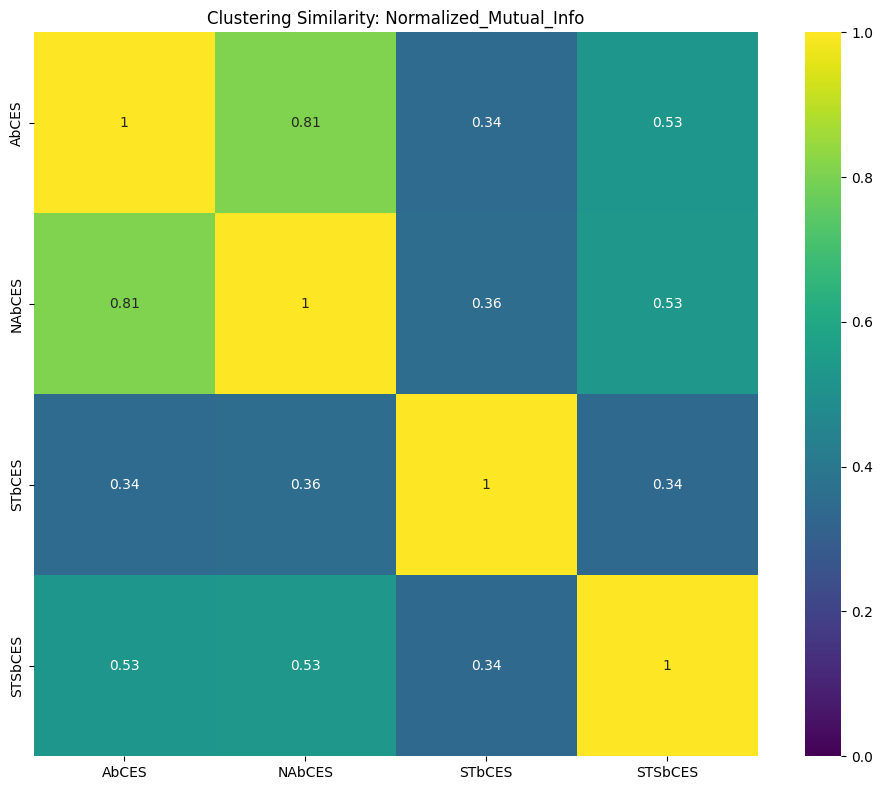

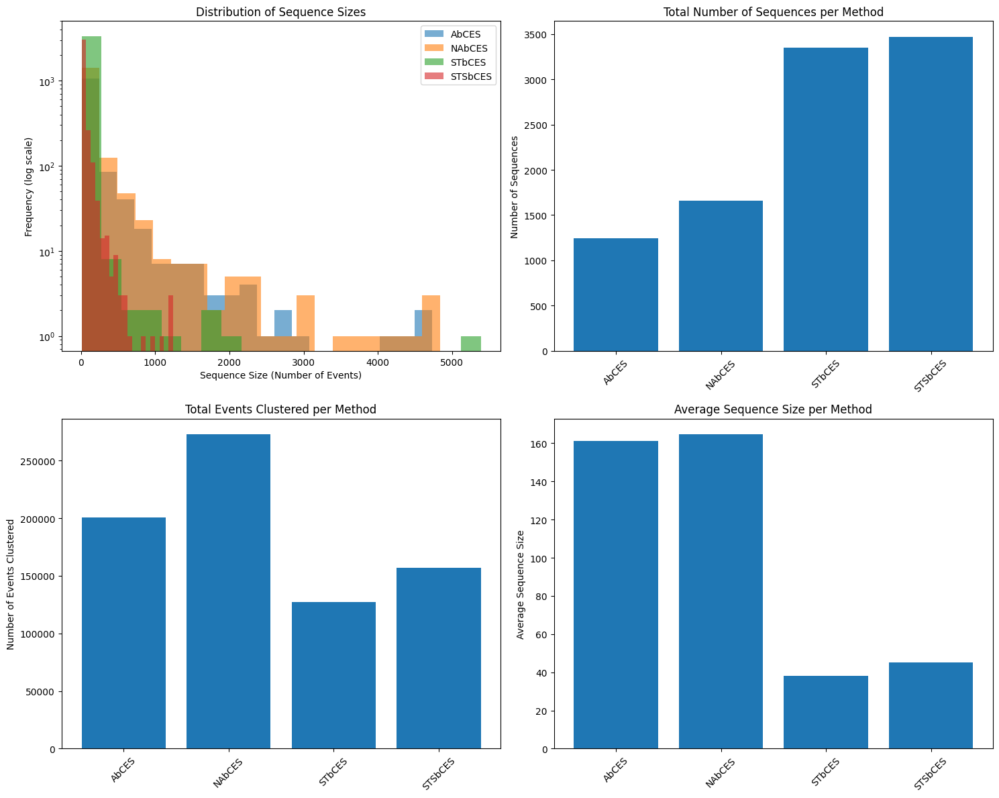

,Method_1,Sequence_1,N_Events_1,Method_2,Sequence_2,N_Events_2,Overlap_Events,Jaccard_Index
1049,AbCES,05510:05659 | 1997–2000,51,NAbCES,15133,51,51,1.000000
588,AbCES,00287:08138 | 2013,29,NAbCES,5792,29,29,1.000000
1127,AbCES,05762:05834 | 2022–2023,36,NAbCES,15368,36,36,1.000000
580,AbCES,00286:05283 | 2002,10,NAbCES,5778,10,10,1.000000
581,AbCES,00286:05394 | 1997–2001,83,NAbCES,5780,83,83,1.000000
...,...,...,...,...,...,...,...,...
5917,NAbCES,22,30,STSbCES,cluster_4403 | 2017-05–2023-12,1242,1,0.000787
4735,NAbCES,5094,2031,STbCES,cluster_1854 | 1998-05-2000-06,49,1,0.000481
4490,NAbCES,3223,23,STbCES,cluster_3328 | 2018-10-2023-12,5385,2,0.000370
5064,NAbCES,7497,13,STbCES,cluster_3328 | 2018-10-2023-12,5385,1,0.000185


In [18]:
comparison.calculate_similarity_metrics()

comparison.plot_similarity_heatmap(metric='Normalized_Mutual_Info')
comparison.plot_sequence_size_comparison()
comparison.analyze_sequence_overlaps()

# 3. Normalize Sequences

In [19]:
normalization_config = {
    'fatalities': 'proportional',
    'event_id_cnty': 'proportional', 
    'time': 'relative_steps',
    'temporal_curve': 'fatality_curve',
    'temporal_curve_integral': 'integral',
    'n_bins': 20,
    'binning_method': 'temporal',
    'curve_type': 'cumulative',
}

In [20]:
dyad_year_seq_cluster.apply_normalization(normalization_config)
combined_dyad_year_seq_cluster.apply_normalization(normalization_config)
HDBScan_seq_cluster.apply_normalization(normalization_config)
embedding_seq_cluster.apply_normalization(normalization_config)

# 4. Cluster Sequences

### Binned normalization + K-means

In [21]:
k = 5

Clustering completed with 5 clusters
  Cluster 0: 343 sequences (27.6%)
  Cluster 1: 141 sequences (11.4%)
  Cluster 2: 348 sequences (28.0%)
  Cluster 3: 129 sequences (10.4%)
  Cluster 4: 281 sequences (22.6%)


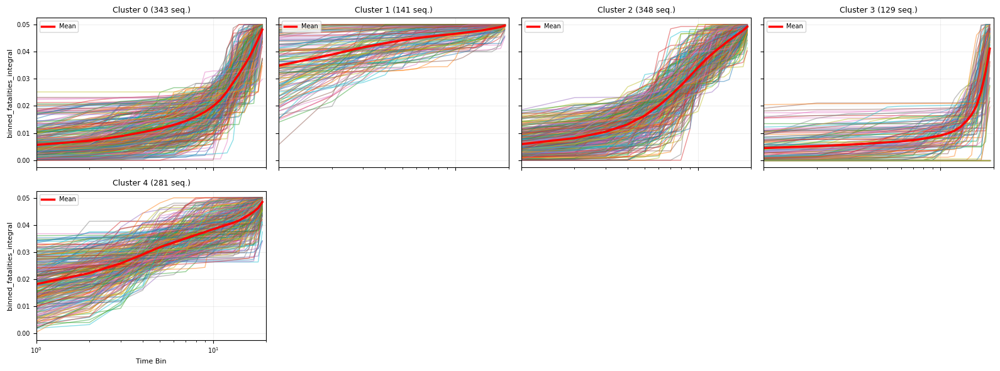

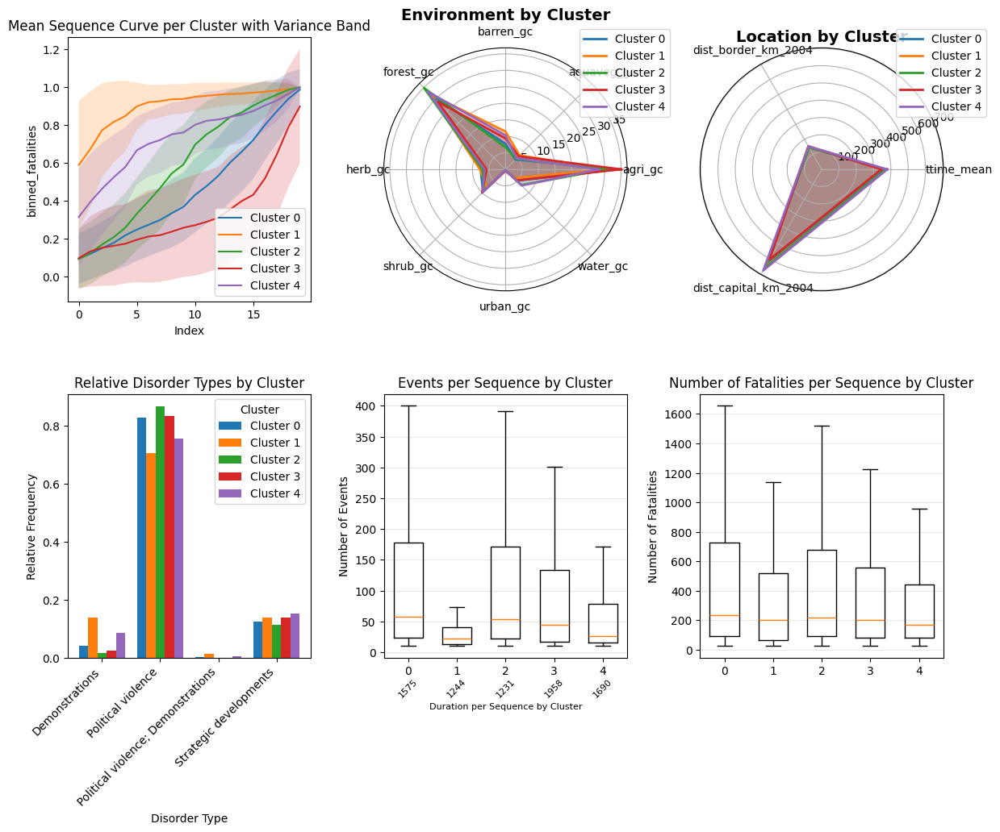

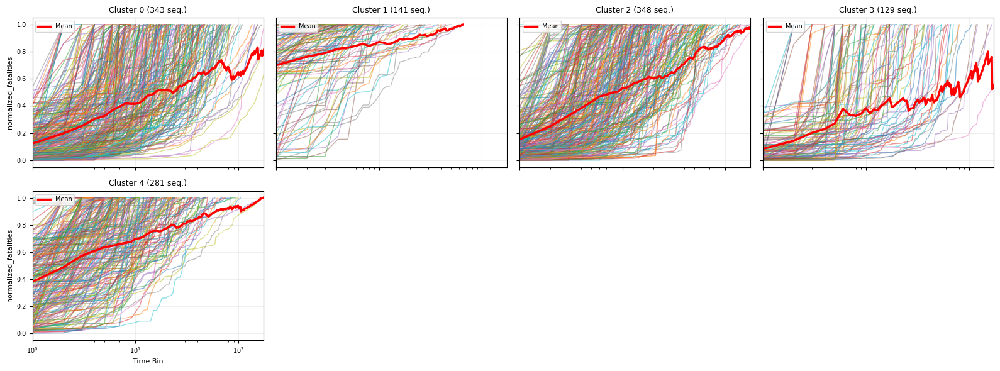

In [22]:
dyad_year_seq_cluster = build_kmean_cluster(k=k,sequences=dyad_year_seq_cluster, metric='binned_fatalities_integral')
plot_cluster(dyad_year_seq_cluster, metric='binned_fatalities_integral')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
plot_cluster(dyad_year_seq_cluster, metric='normalized_fatalities')


dyad
Binning completed with 5 clusters
  Cluster 0: 1242 sequences (100.0%) range [1.00, 1.00]
  Cluster 1: 0 sequences (0.0%) range [1.00, 1.00]
  Cluster 2: 0 sequences (0.0%) range [1.00, 1.00]
  Cluster 3: 0 sequences (0.0%) range [1.00, 1.00]
  Cluster 4: 0 sequences (0.0%) range [1.00, 1.00]


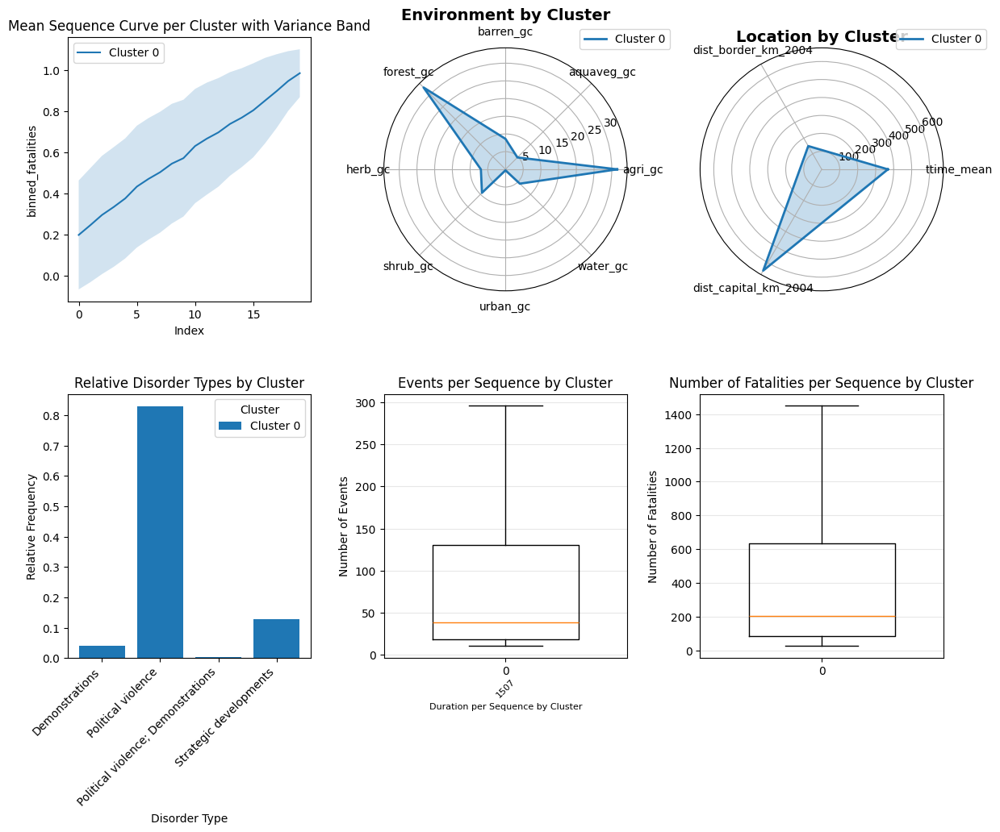

fatalities
Binning completed with 5 clusters
  Cluster 0: 288 sequences (23.2%) range [2.08, 7.64]
  Cluster 1: 222 sequences (17.9%) range [7.64, 12.96]
  Cluster 2: 223 sequences (18.0%) range [12.96, 21.08]
  Cluster 3: 223 sequences (18.0%) range [21.08, 38.84]
  Cluster 4: 286 sequences (23.0%) range [38.84, 4584.64]


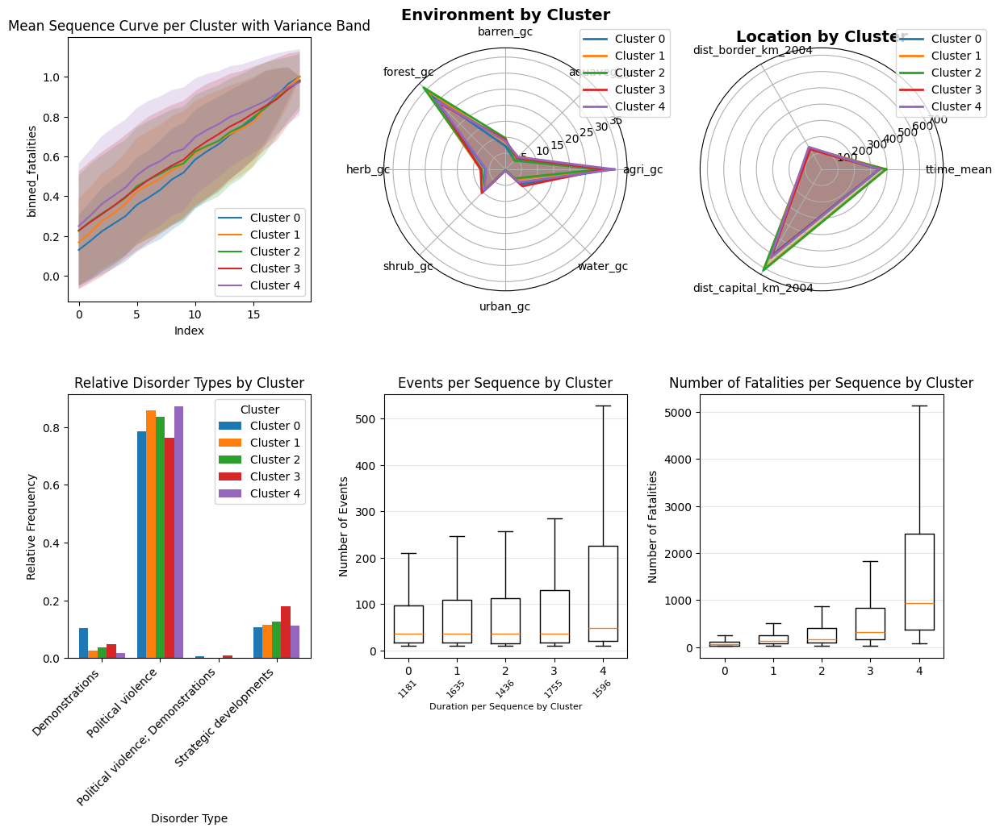

event_id_cnty
Binning completed with 5 clusters
  Cluster 0: 285 sequences (22.9%) range [1.11, 2.33]
  Cluster 1: 228 sequences (18.4%) range [2.33, 3.00]
  Cluster 2: 223 sequences (18.0%) range [3.00, 4.00]
  Cluster 3: 220 sequences (17.7%) range [4.00, 6.00]
  Cluster 4: 286 sequences (23.0%) range [6.00, 304.11]


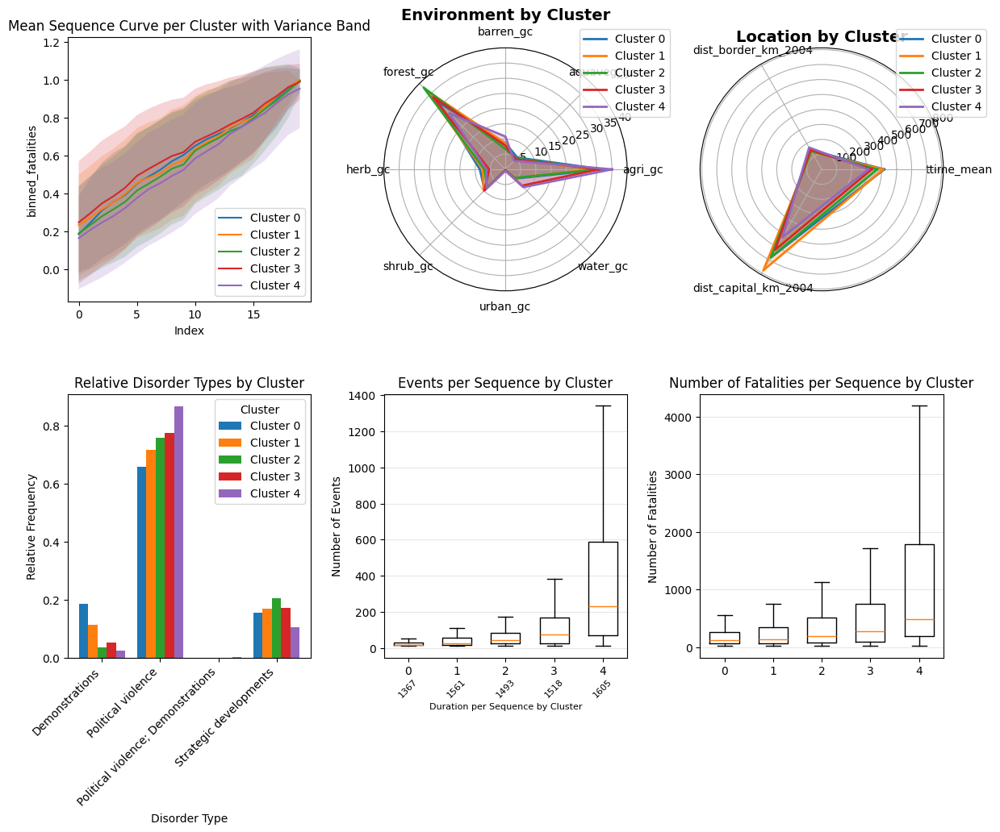

gid
Binning completed with 5 clusters
  Cluster 0: 310 sequences (25.0%) range [1.00, 1.50]
  Cluster 1: 202 sequences (16.3%) range [1.50, 1.80]
  Cluster 2: 222 sequences (17.9%) range [1.80, 2.25]
  Cluster 3: 221 sequences (17.8%) range [2.25, 3.14]
  Cluster 4: 287 sequences (23.1%) range [3.14, 23.50]


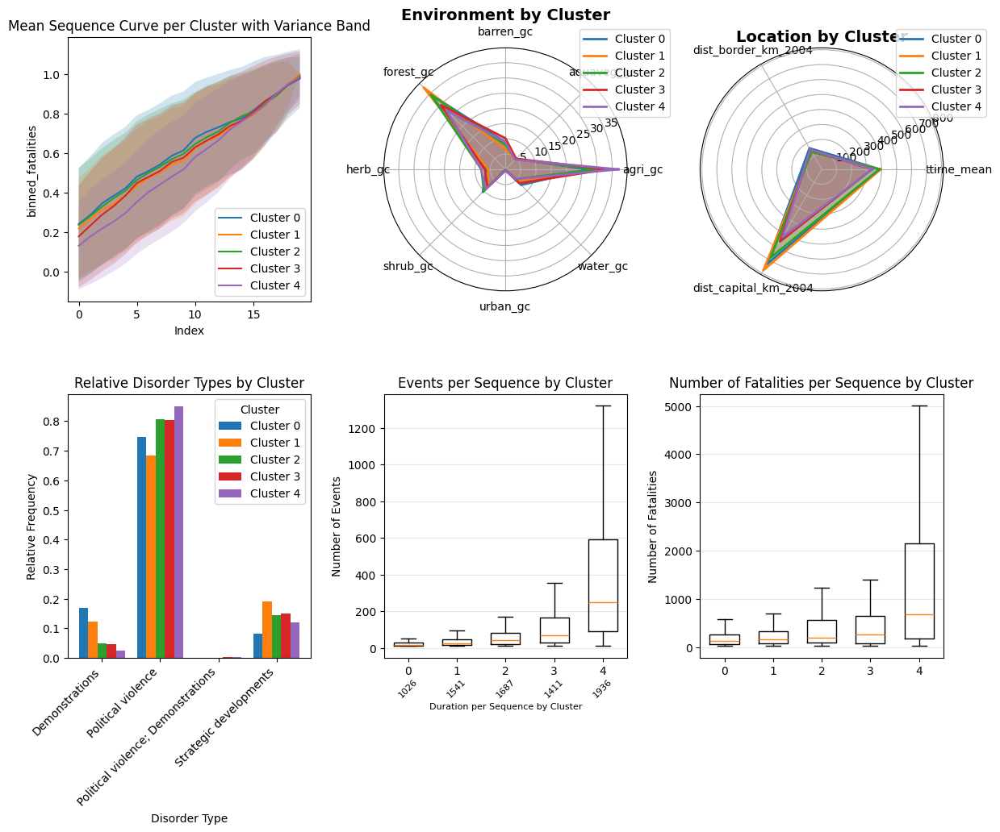

dist_border_km_2004
Binning completed with 5 clusters
  Cluster 0: 287 sequences (23.1%) range [4.58, 65.12]
  Cluster 1: 223 sequences (18.0%) range [65.12, 98.44]
  Cluster 2: 223 sequences (18.0%) range [98.44, 143.42]
  Cluster 3: 223 sequences (18.0%) range [143.42, 231.46]
  Cluster 4: 286 sequences (23.0%) range [231.46, 558.95]


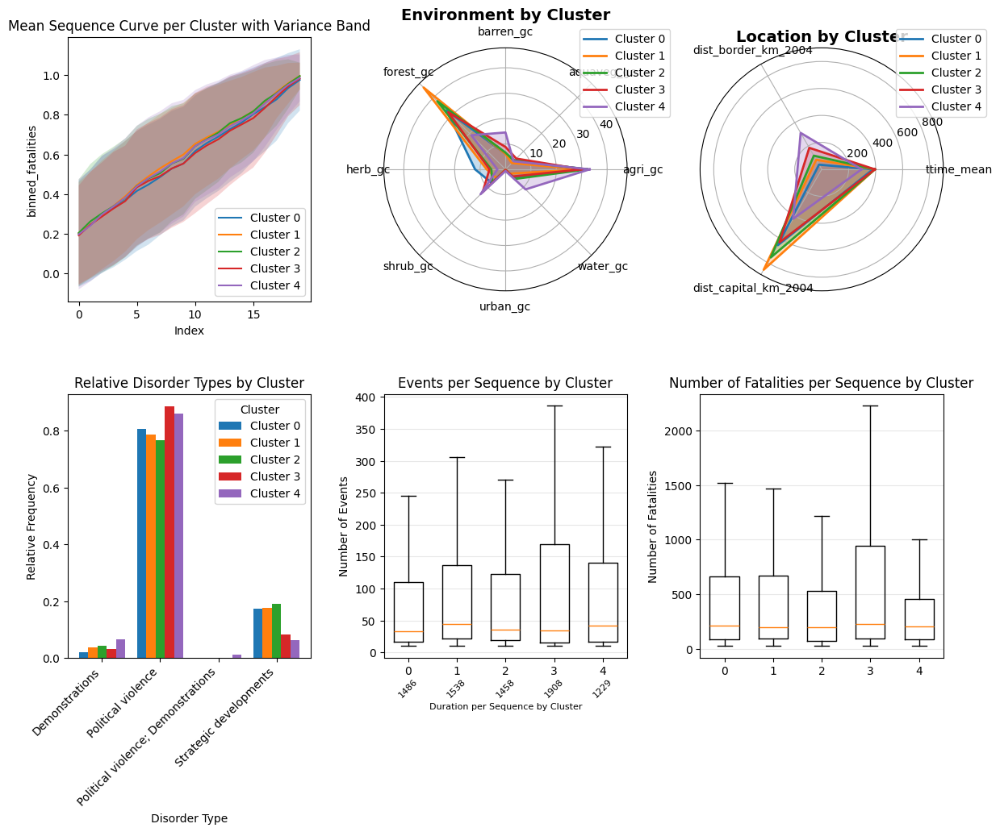

dist_capital_km_2004
Binning completed with 5 clusters
  Cluster 0: 287 sequences (23.1%) range [43.26, 256.35]
  Cluster 1: 223 sequences (18.0%) range [256.35, 387.15]
  Cluster 2: 223 sequences (18.0%) range [387.15, 638.97]
  Cluster 3: 223 sequences (18.0%) range [638.97, 960.77]
  Cluster 4: 286 sequences (23.0%) range [960.77, 1787.78]


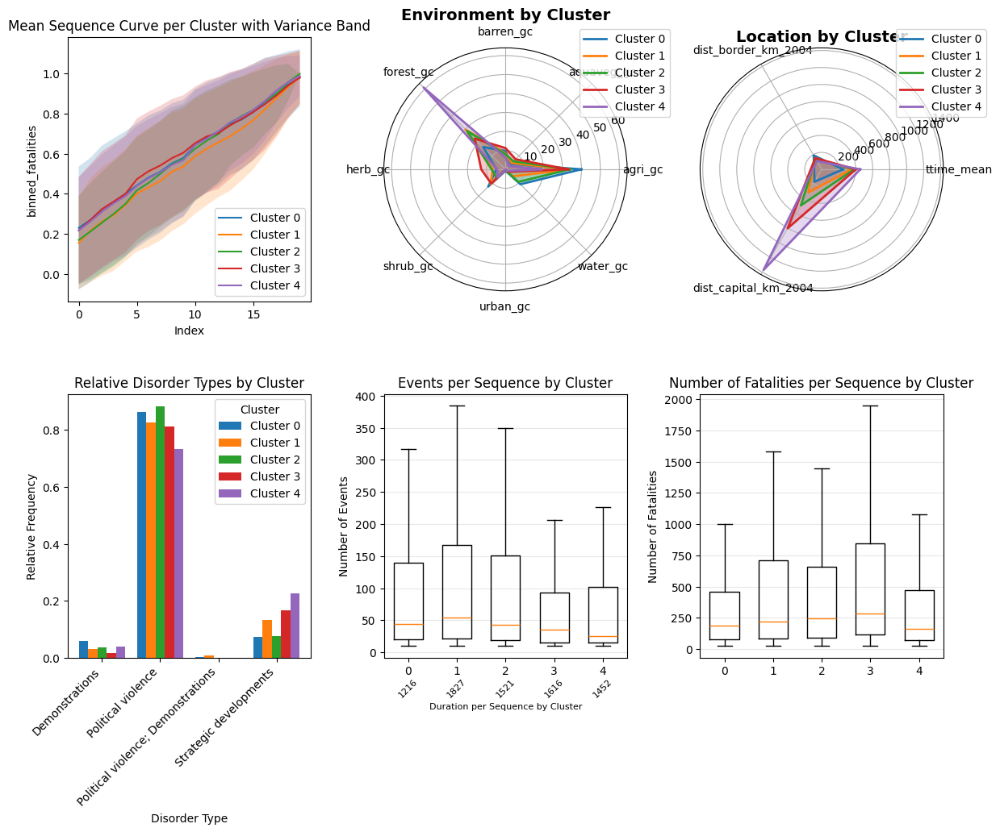

In [29]:
print('dyad')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='dyad', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('fatalities')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='fatalities', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('event_id_cnty')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='event_id_cnty', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('gid')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='gid', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_border_km_2004')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='dist_border_km_2004', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_capital_km_2004')
dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=dyad_year_seq_cluster, metric='dist_capital_km_2004', method='quantile')
plot_cluster_summary(dyad_year_seq_cluster,'binned_index', 'binned_fatalities')

Clustering completed with 5 clusters
  Cluster 0: 467 sequences (28.2%)
  Cluster 1: 206 sequences (12.4%)
  Cluster 2: 393 sequences (23.7%)
  Cluster 3: 258 sequences (15.6%)
  Cluster 4: 332 sequences (20.0%)


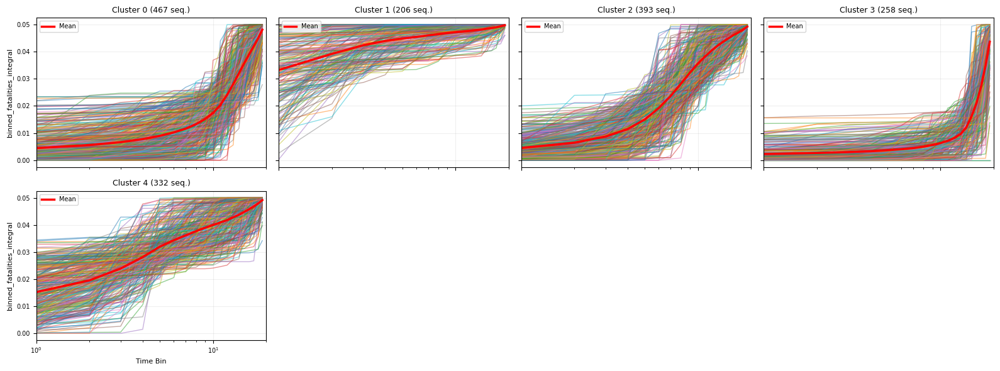

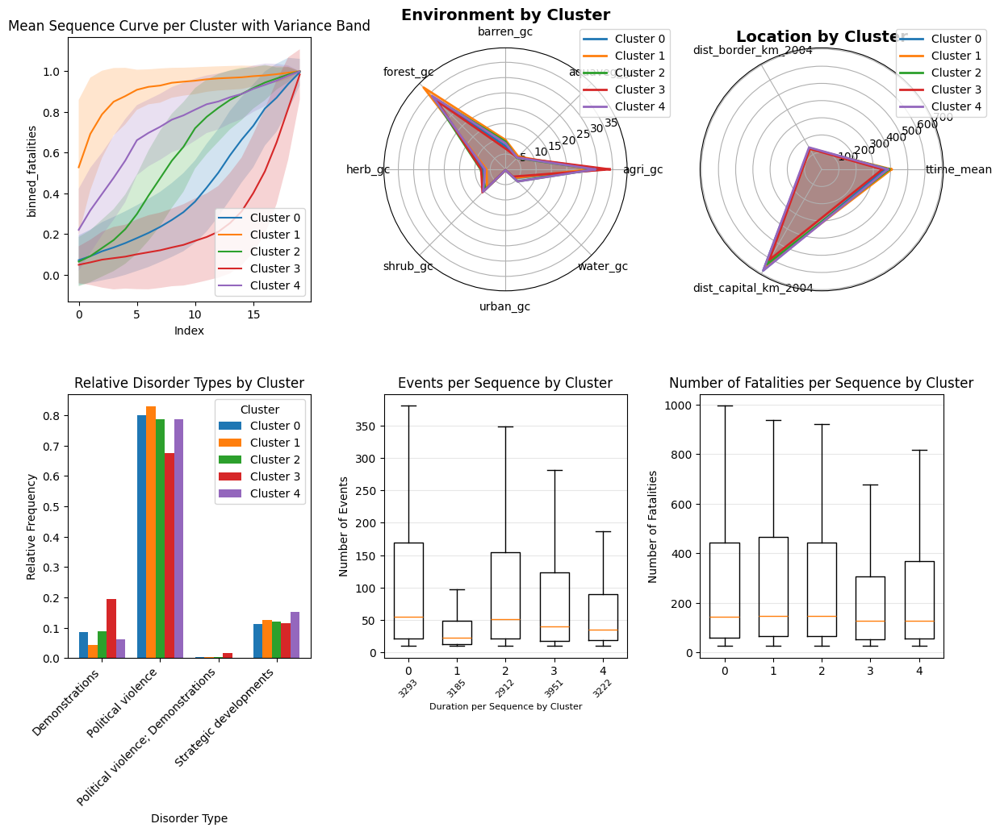

In [24]:
combined_dyad_year_seq_cluster = build_kmean_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='binned_fatalities_integral')
plot_cluster(combined_dyad_year_seq_cluster, metric='binned_fatalities_integral')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')

dyad
Binning completed with 5 clusters
  Cluster 0: 1397 sequences (84.4%) range [1.00, 1.11]
  Cluster 1: 75 sequences (4.5%) range [1.11, 1.22]
  Cluster 2: 43 sequences (2.6%) range [1.22, 1.32]
  Cluster 3: 26 sequences (1.6%) range [1.32, 1.43]
  Cluster 4: 115 sequences (6.9%) range [1.43, 4.22]


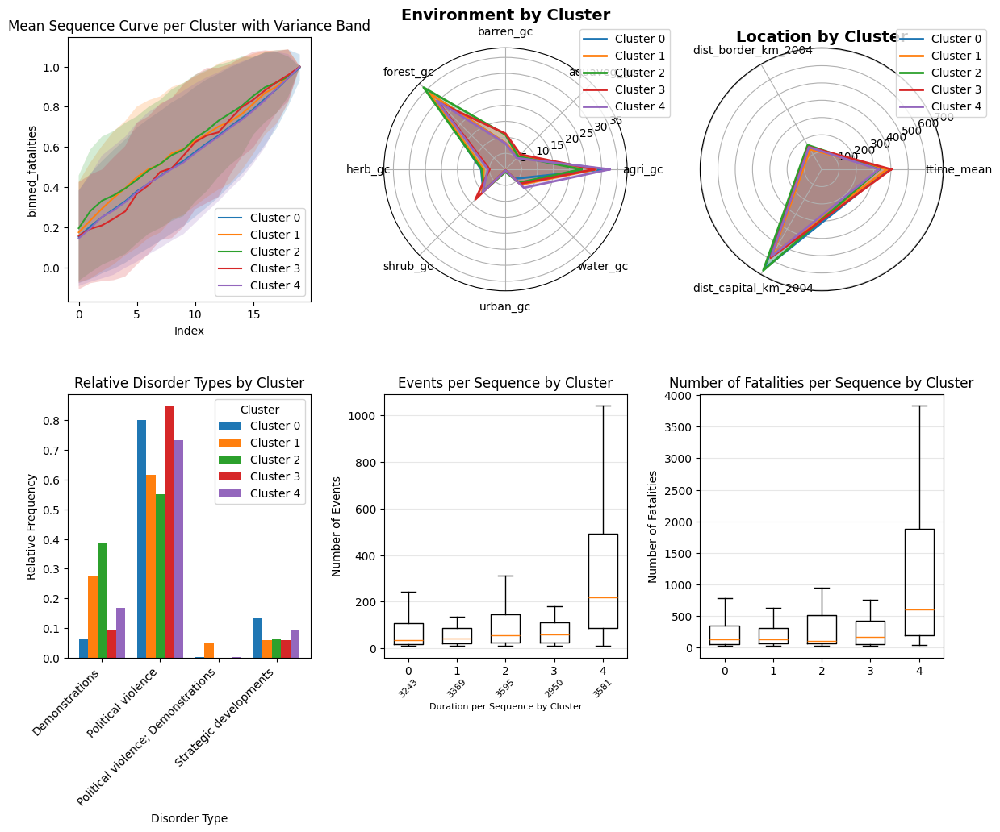

fatalities
Binning completed with 5 clusters
  Cluster 0: 382 sequences (23.1%) range [0.24, 3.43]
  Cluster 1: 303 sequences (18.3%) range [3.43, 6.00]
  Cluster 2: 294 sequences (17.8%) range [6.00, 10.50]
  Cluster 3: 297 sequences (17.9%) range [10.50, 21.82]
  Cluster 4: 380 sequences (22.9%) range [21.82, 3379.47]


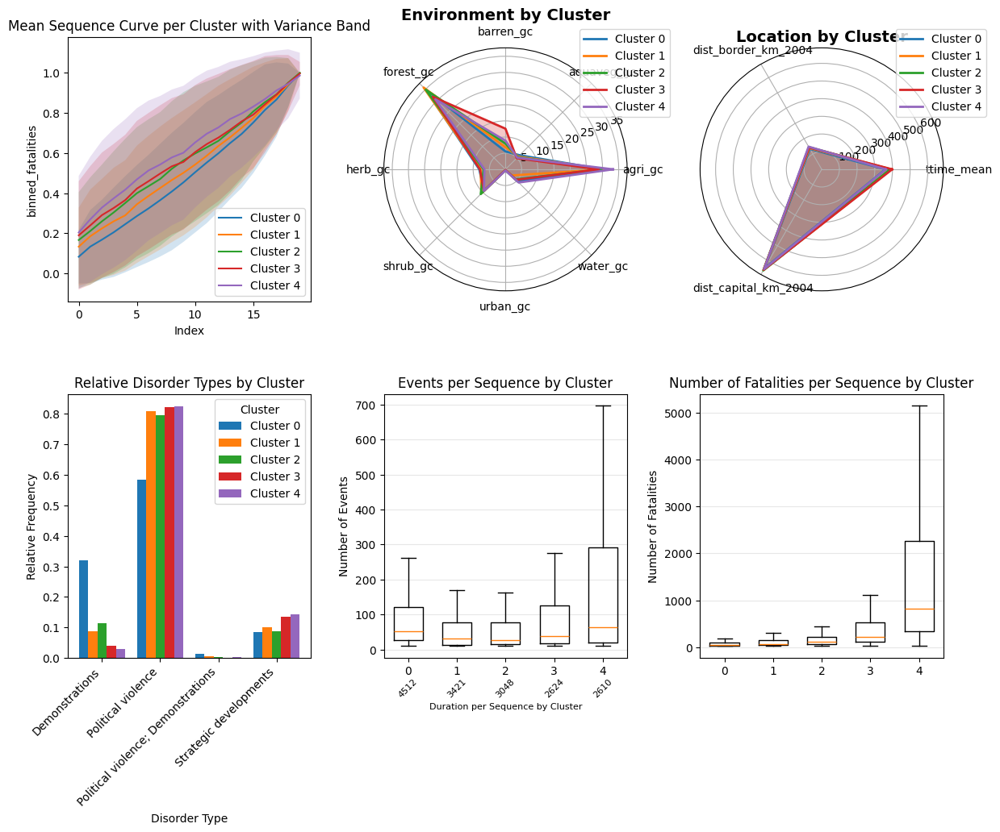

event_id_cnty
Binning completed with 5 clusters
  Cluster 0: 371 sequences (22.4%) range [1.00, 1.58]
  Cluster 1: 327 sequences (19.7%) range [1.58, 2.00]
  Cluster 2: 274 sequences (16.5%) range [2.00, 2.72]
  Cluster 3: 300 sequences (18.1%) range [2.72, 4.12]
  Cluster 4: 384 sequences (23.2%) range [4.12, 304.11]


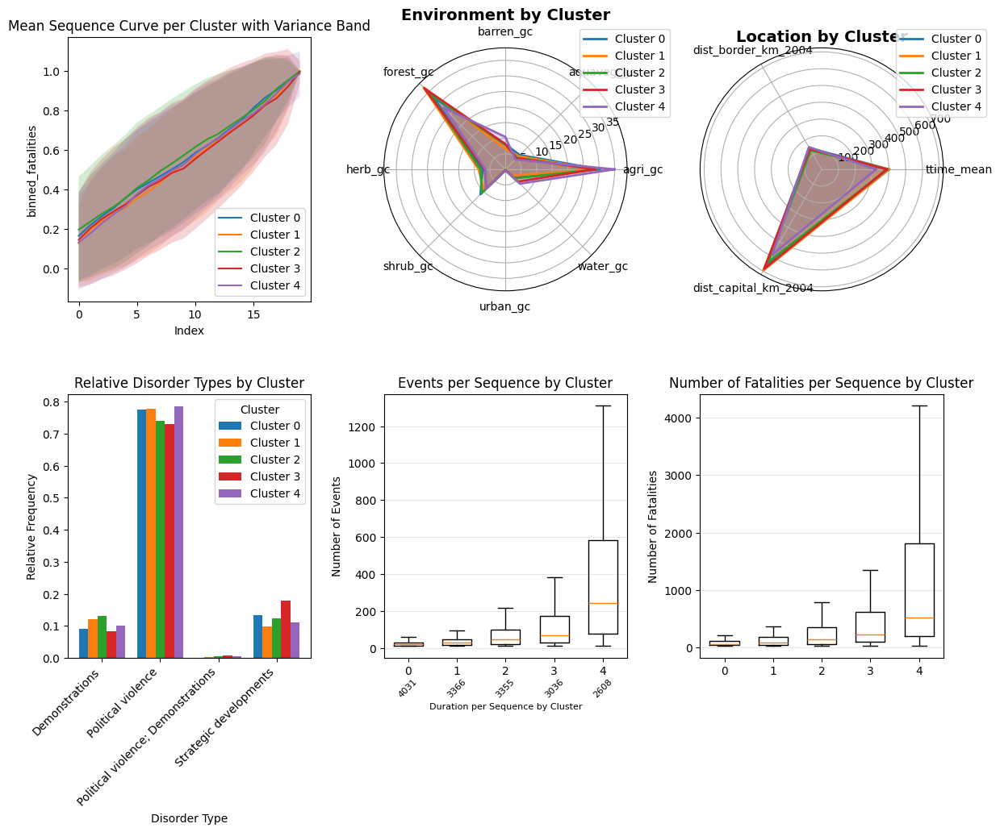

gid
Binning completed with 5 clusters
  Cluster 0: 328 sequences (19.8%) range [1.00, 1.20]
  Cluster 1: 311 sequences (18.8%) range [1.20, 1.40]
  Cluster 2: 306 sequences (18.5%) range [1.40, 1.69]
  Cluster 3: 313 sequences (18.9%) range [1.69, 2.39]
  Cluster 4: 398 sequences (24.0%) range [2.39, 23.50]


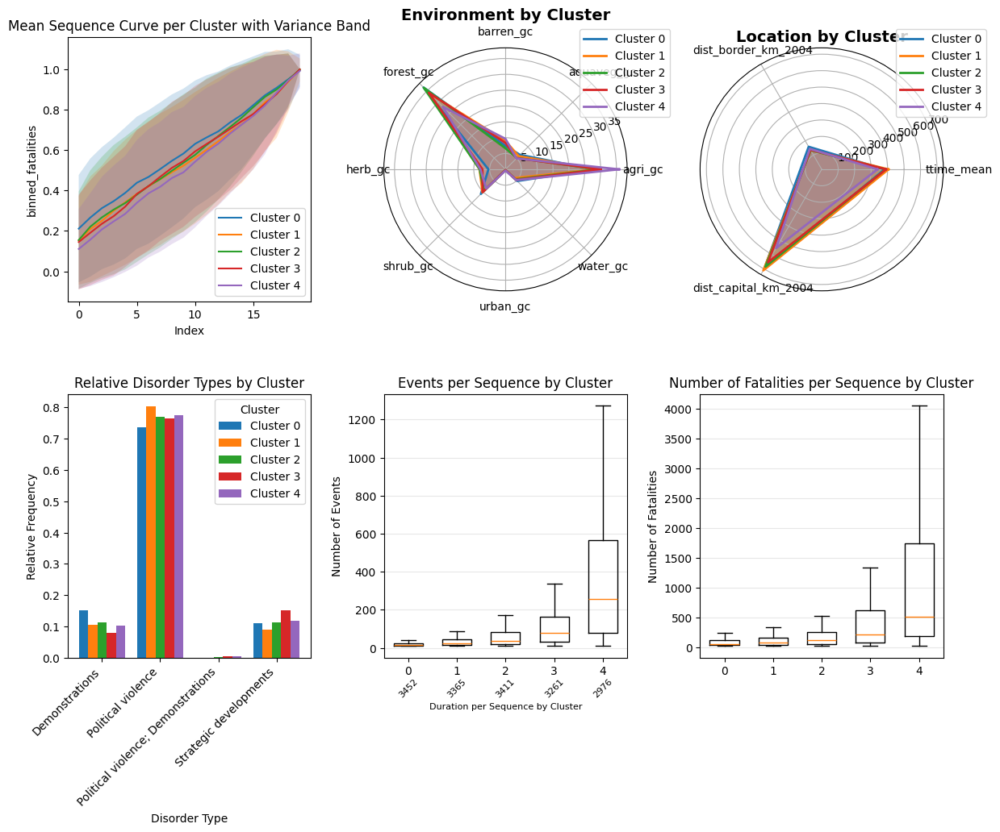

dist_border_km_2004
Binning completed with 5 clusters
  Cluster 0: 381 sequences (23.0%) range [6.52, 65.26]
  Cluster 1: 298 sequences (18.0%) range [65.26, 96.33]
  Cluster 2: 298 sequences (18.0%) range [96.33, 141.68]
  Cluster 3: 298 sequences (18.0%) range [141.68, 217.49]
  Cluster 4: 381 sequences (23.0%) range [217.49, 554.85]


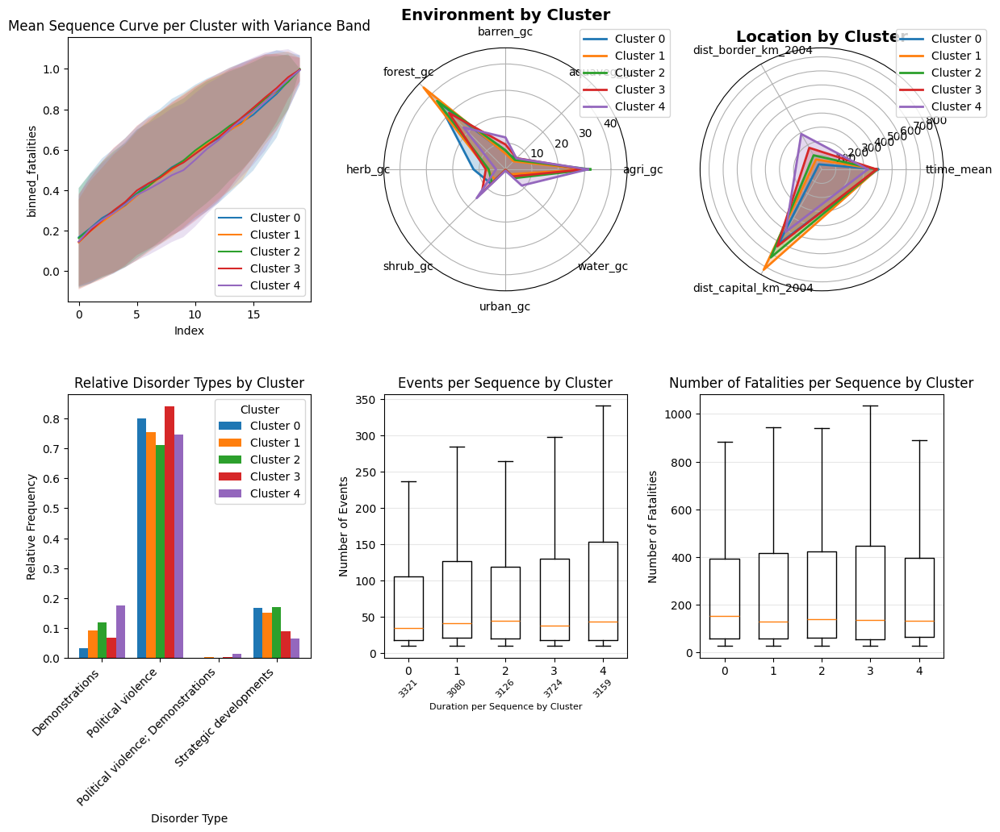

dist_capital_km_2004
Binning completed with 5 clusters
  Cluster 0: 381 sequences (23.0%) range [39.19, 265.46]
  Cluster 1: 298 sequences (18.0%) range [265.46, 391.69]
  Cluster 2: 298 sequences (18.0%) range [391.69, 645.47]
  Cluster 3: 298 sequences (18.0%) range [645.47, 951.31]
  Cluster 4: 381 sequences (23.0%) range [951.31, 1787.78]


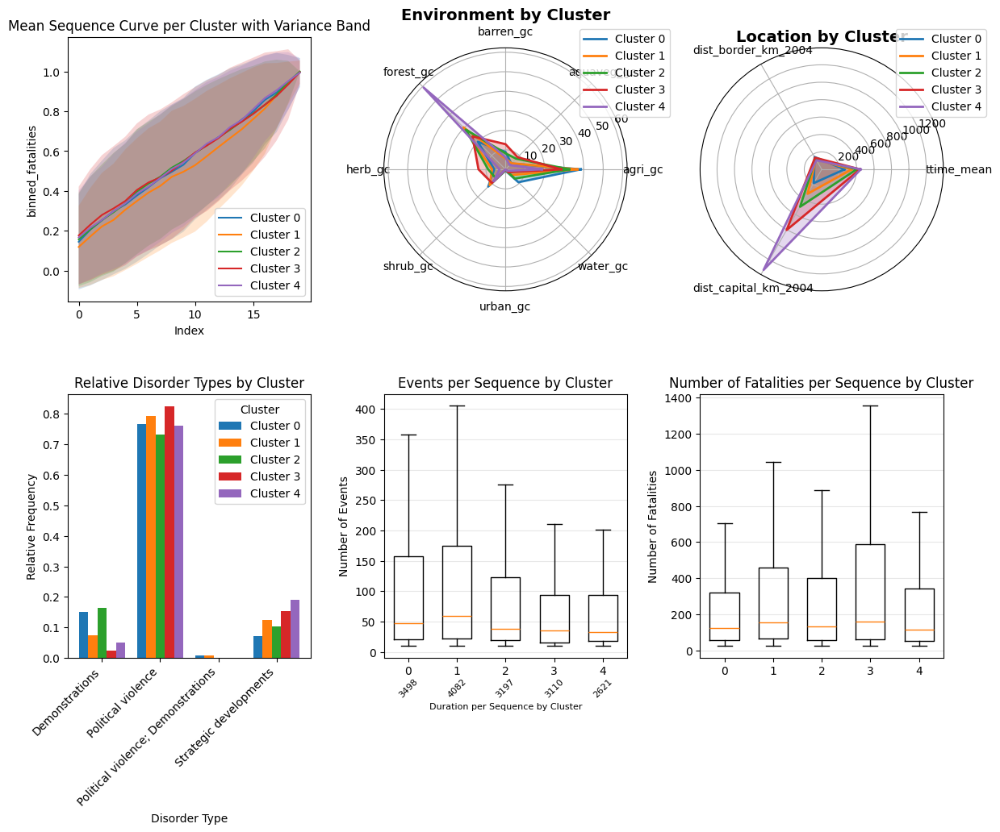

In [33]:
print('dyad')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='dyad', method='uniform')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('fatalities')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='fatalities', method='quantile')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('event_id_cnty')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='event_id_cnty', method='quantile')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('gid')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='gid', method='quantile')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_border_km_2004')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='dist_border_km_2004', method='quantile')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_capital_km_2004')
combined_dyad_year_seq_cluster = build_numeric_feature_cluster(k=k,sequences=combined_dyad_year_seq_cluster, metric='dist_capital_km_2004', method='quantile')
plot_cluster_summary(combined_dyad_year_seq_cluster,'binned_index', 'binned_fatalities')

Clustering completed with 5 clusters
  Cluster 0: 993 sequences (28.6%)
  Cluster 1: 1000 sequences (28.8%)
  Cluster 2: 353 sequences (10.2%)
  Cluster 3: 743 sequences (21.4%)
  Cluster 4: 380 sequences (11.0%)


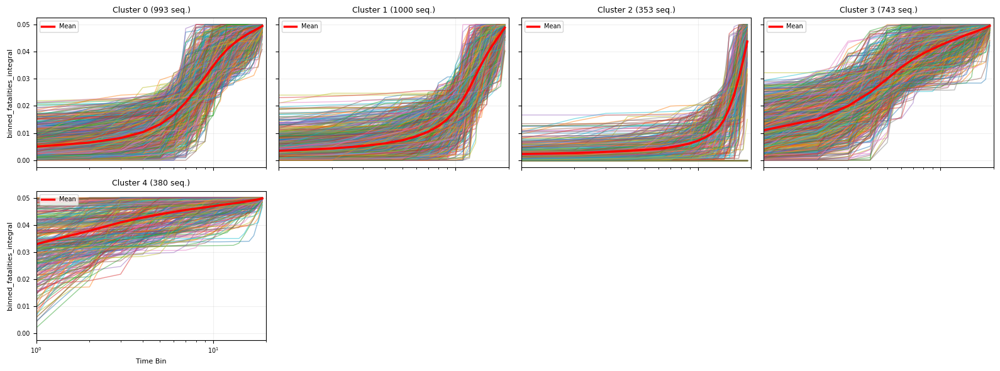

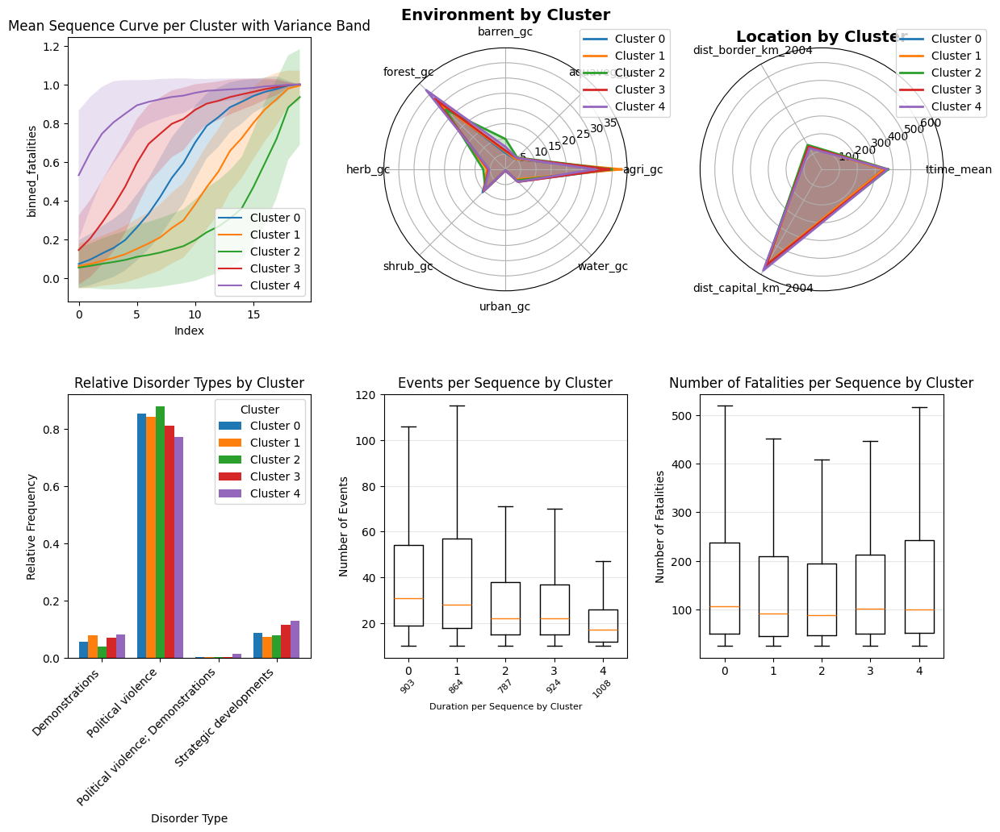

In [25]:
embedding_seq_cluster = build_kmean_cluster(k=k,sequences=embedding_seq_cluster, metric='binned_fatalities_integral')
plot_cluster(embedding_seq_cluster, metric='binned_fatalities_integral')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')

dyad
Binning completed with 5 clusters
  Cluster 0: 2067 sequences (59.6%) range [1.00, 1.23]
  Cluster 1: 650 sequences (18.7%) range [1.23, 1.46]
  Cluster 2: 311 sequences (9.0%) range [1.46, 1.69]
  Cluster 3: 181 sequences (5.2%) range [1.69, 1.91]
  Cluster 4: 260 sequences (7.5%) range [1.91, 5.74]


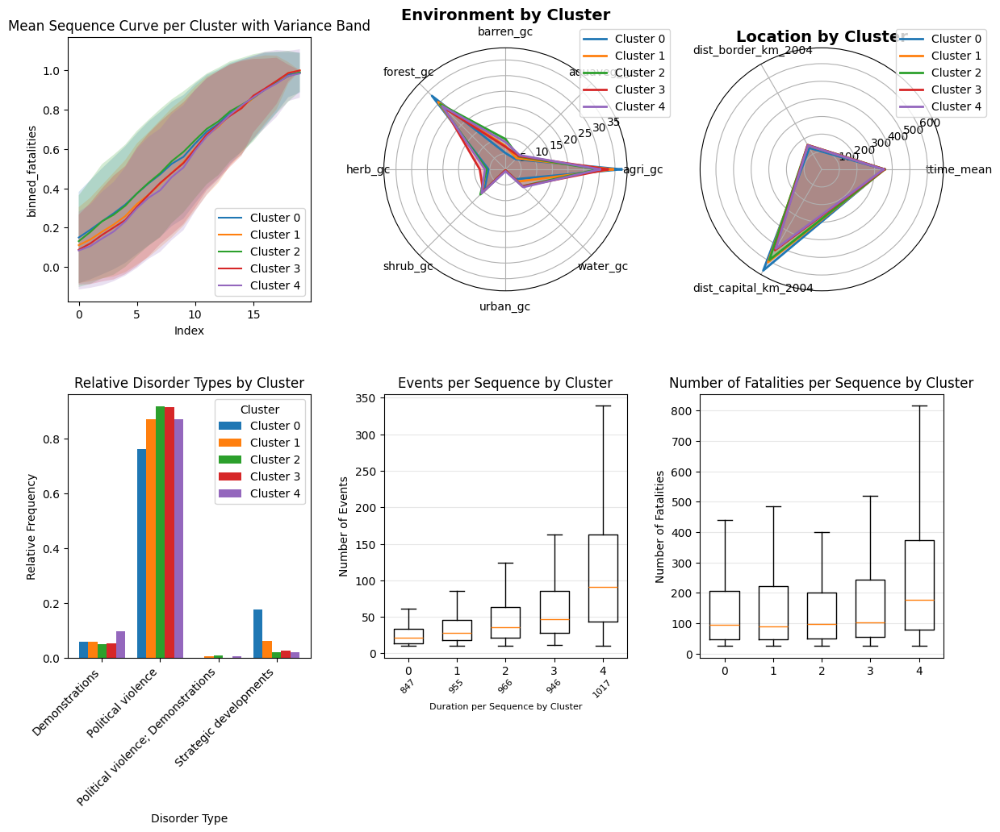

fatalities
Binning completed with 5 clusters
  Cluster 0: 801 sequences (23.1%) range [0.51, 4.40]
  Cluster 1: 622 sequences (17.9%) range [4.40, 7.18]
  Cluster 2: 624 sequences (18.0%) range [7.18, 11.73]
  Cluster 3: 626 sequences (18.0%) range [11.73, 21.67]
  Cluster 4: 796 sequences (22.9%) range [21.67, 13000.00]


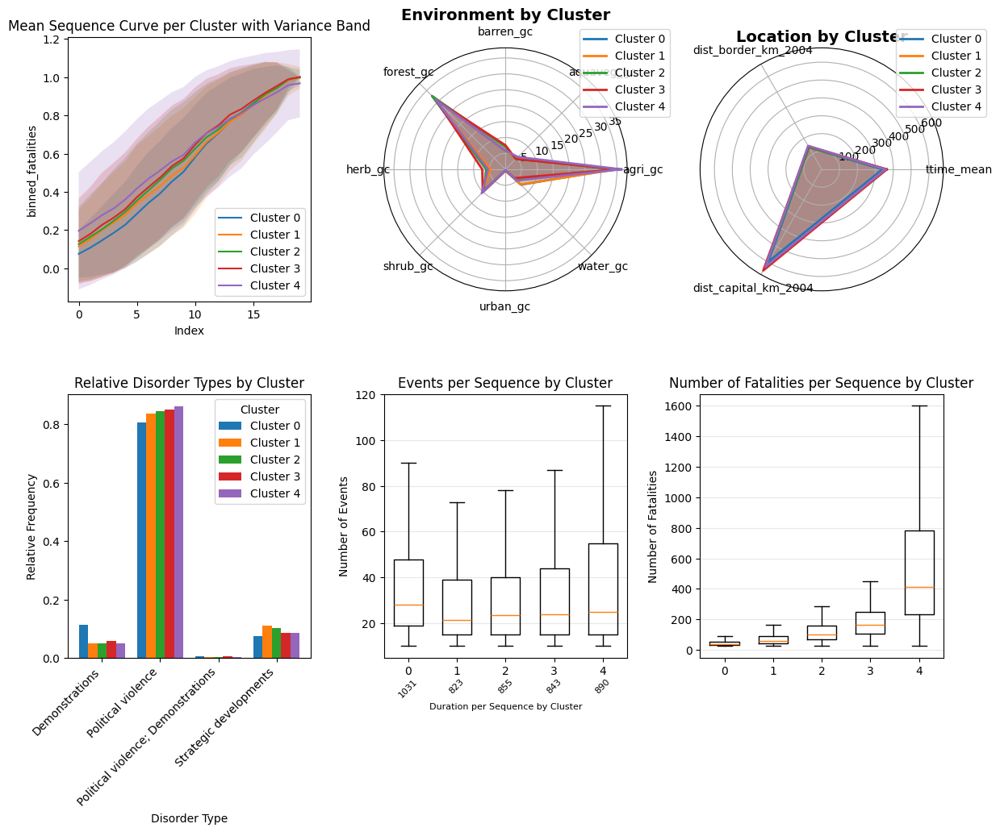

event_id_cnty
Binning completed with 5 clusters
  Cluster 0: 798 sequences (23.0%) range [1.00, 1.72]
  Cluster 1: 626 sequences (18.0%) range [1.72, 2.11]
  Cluster 2: 625 sequences (18.0%) range [2.11, 2.65]
  Cluster 3: 621 sequences (17.9%) range [2.65, 3.59]
  Cluster 4: 799 sequences (23.0%) range [3.59, 39.26]


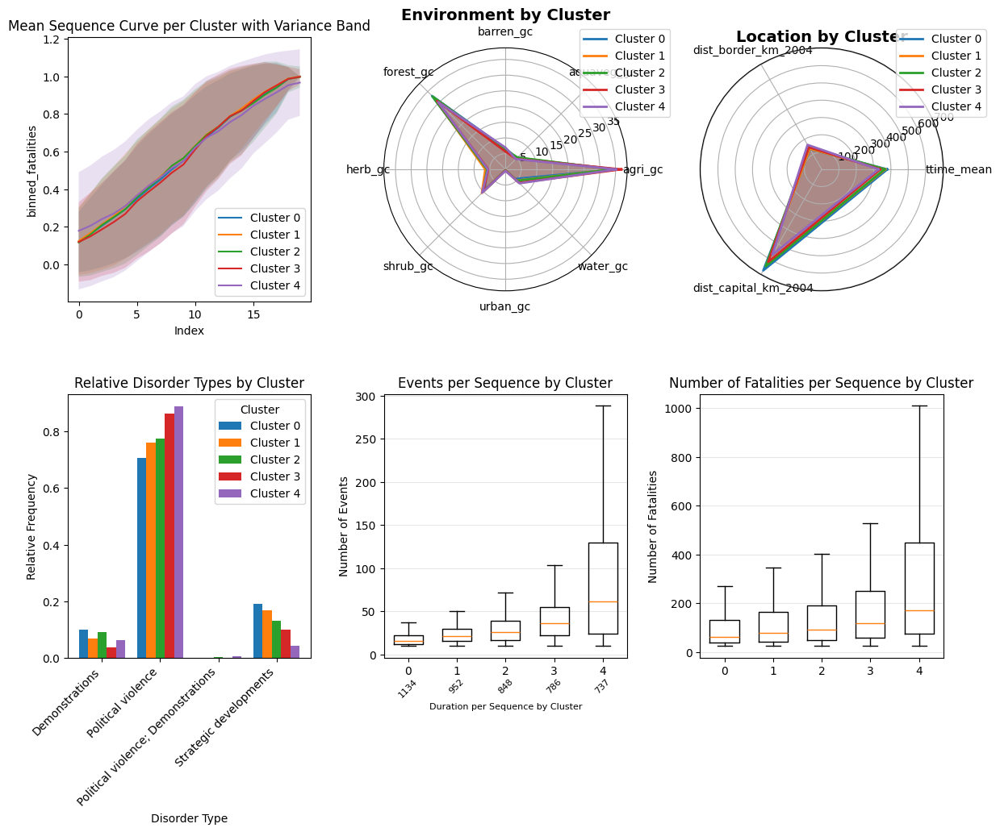

gid
Binning completed with 5 clusters
  Cluster 0: 705 sequences (20.3%) range [1.00, 1.22]
  Cluster 1: 651 sequences (18.8%) range [1.22, 1.43]
  Cluster 2: 622 sequences (17.9%) range [1.43, 1.68]
  Cluster 3: 667 sequences (19.2%) range [1.68, 2.14]
  Cluster 4: 824 sequences (23.8%) range [2.14, 15.54]


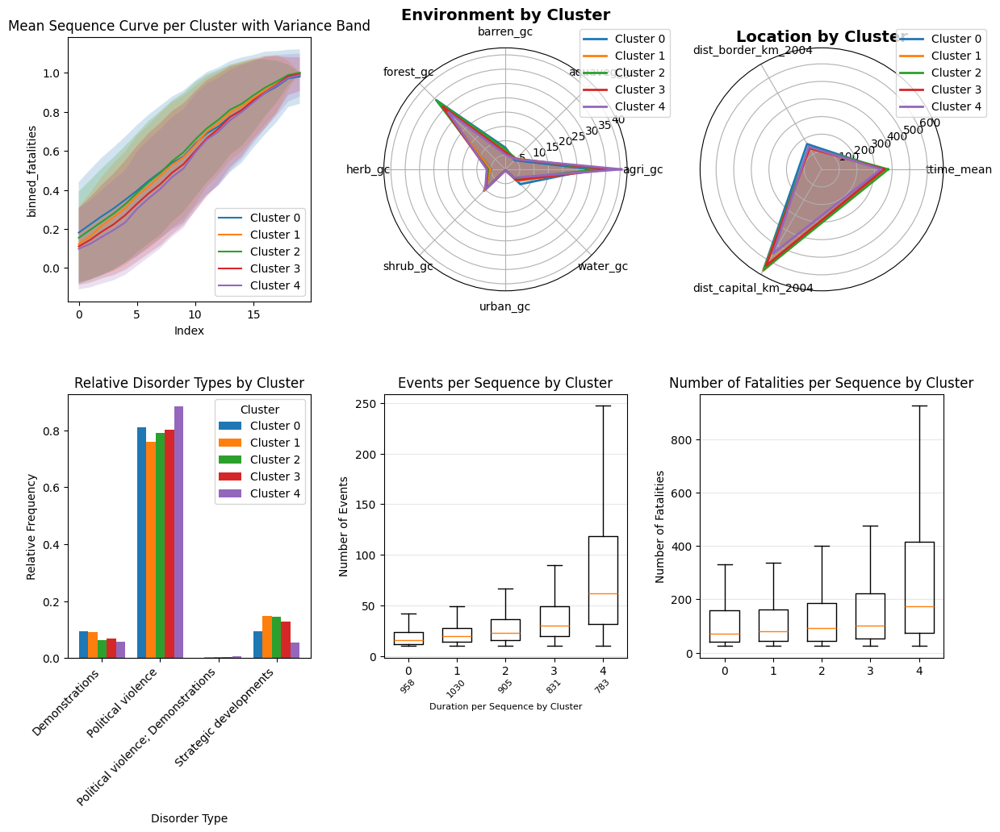

dist_border_km_2004
Binning completed with 5 clusters
  Cluster 0: 799 sequences (23.0%) range [1.70, 61.98]
  Cluster 1: 624 sequences (18.0%) range [61.98, 93.01]
  Cluster 2: 624 sequences (18.0%) range [93.01, 133.60]
  Cluster 3: 624 sequences (18.0%) range [133.60, 221.94]
  Cluster 4: 798 sequences (23.0%) range [221.94, 603.02]


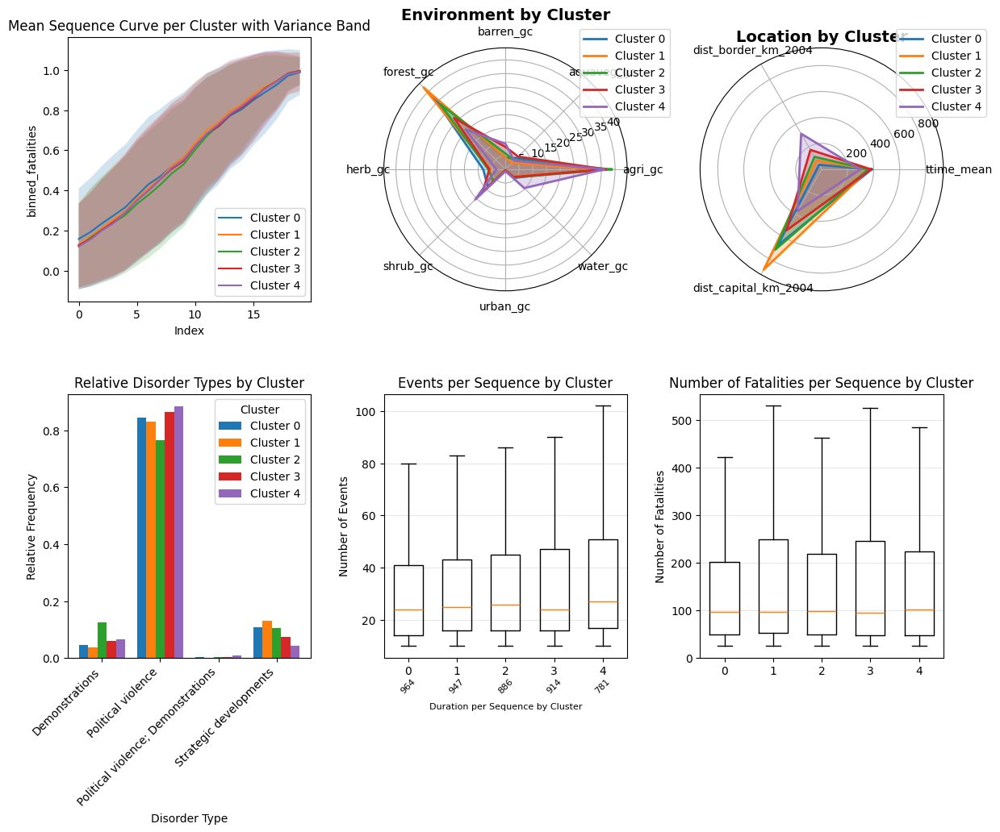

dist_capital_km_2004
Binning completed with 5 clusters
  Cluster 0: 799 sequences (23.0%) range [26.33, 237.53]
  Cluster 1: 624 sequences (18.0%) range [237.53, 370.78]
  Cluster 2: 624 sequences (18.0%) range [370.78, 585.66]
  Cluster 3: 624 sequences (18.0%) range [585.66, 935.60]
  Cluster 4: 798 sequences (23.0%) range [935.60, 1836.55]


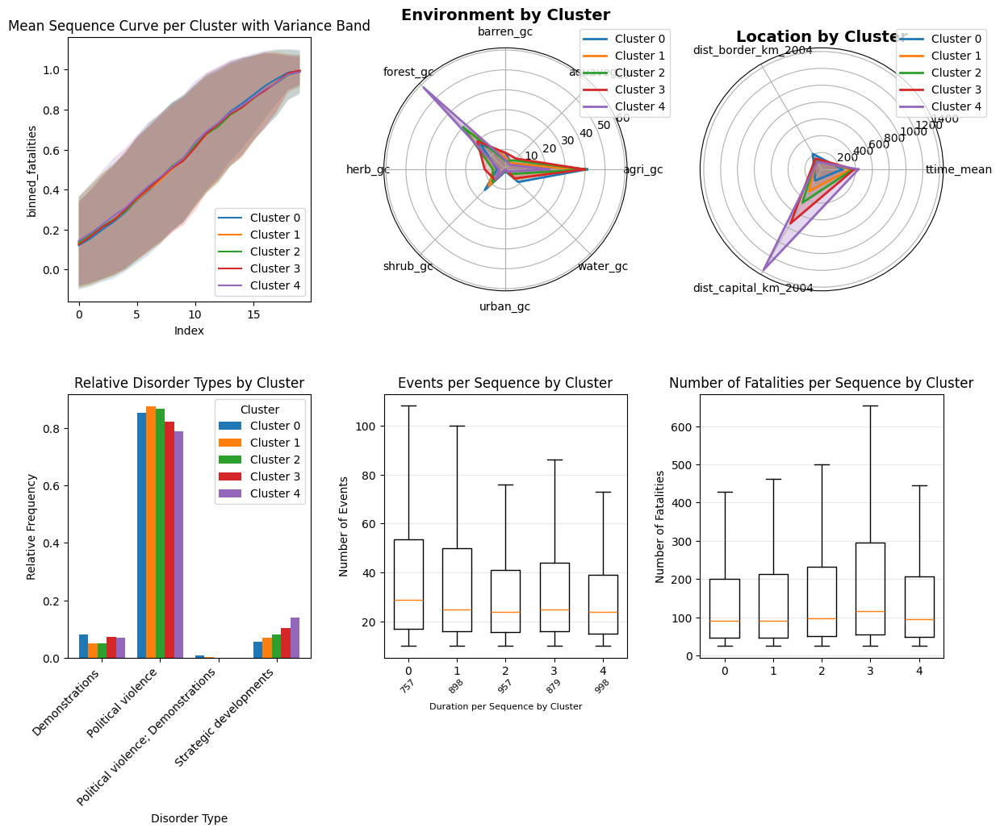

In [34]:
print('dyad')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='dyad', method='uniform')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')
print('fatalities')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='fatalities', method='quantile')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')
print('event_id_cnty')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='event_id_cnty', method='quantile')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')
print('gid')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='gid', method='quantile')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_border_km_2004')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='dist_border_km_2004', method='quantile')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_capital_km_2004')
embedding_seq_cluster = build_numeric_feature_cluster(k=k,sequences=embedding_seq_cluster, metric='dist_capital_km_2004', method='quantile')
plot_cluster_summary(embedding_seq_cluster,'binned_index', 'binned_fatalities')

Clustering completed with 5 clusters
  Cluster 0: 597 sequences (17.8%)
  Cluster 1: 1061 sequences (31.7%)
  Cluster 2: 177 sequences (5.3%)
  Cluster 3: 1057 sequences (31.5%)
  Cluster 4: 460 sequences (13.7%)


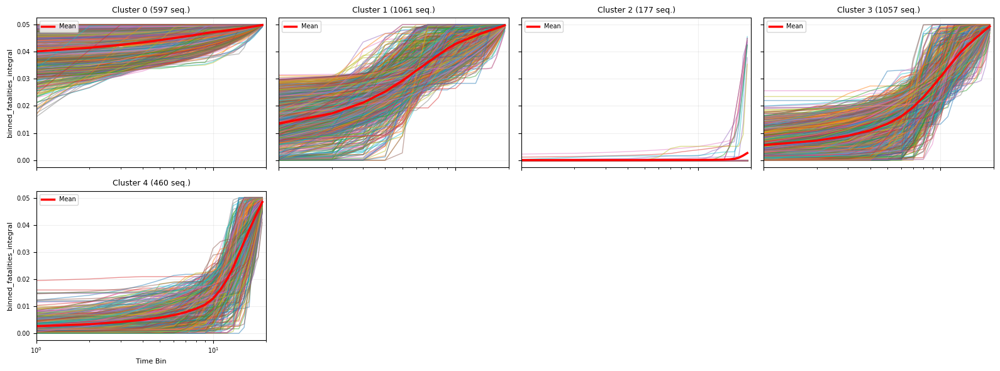

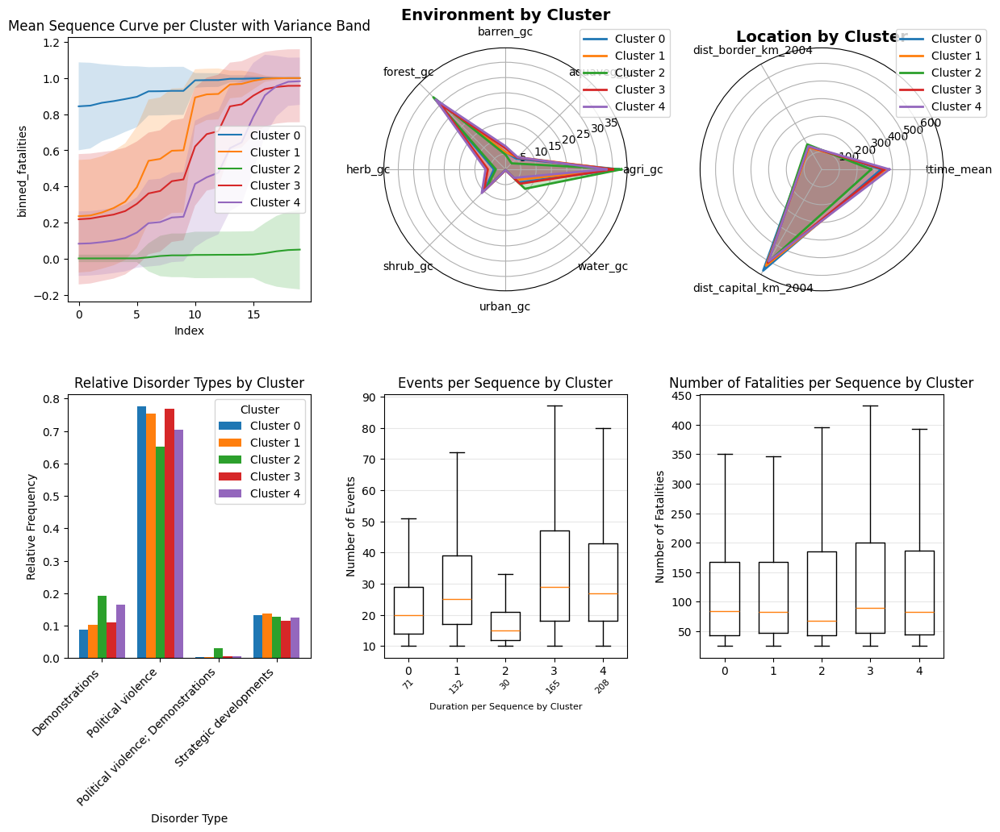

In [27]:
HDBScan_seq_cluster = build_kmean_cluster(k=k,sequences= HDBScan_seq_cluster, metric='binned_fatalities_integral')
plot_cluster(HDBScan_seq_cluster, metric='binned_fatalities_integral')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')

dyad
Binning completed with 5 clusters
  Cluster 0: 1256 sequences (37.5%) range [1.00, 2.87]
  Cluster 1: 1056 sequences (31.5%) range [2.87, 4.12]
  Cluster 2: 504 sequences (15.0%) range [4.12, 5.38]
  Cluster 3: 238 sequences (7.1%) range [5.38, 6.63]
  Cluster 4: 298 sequences (8.9%) range [6.63, 18.00]


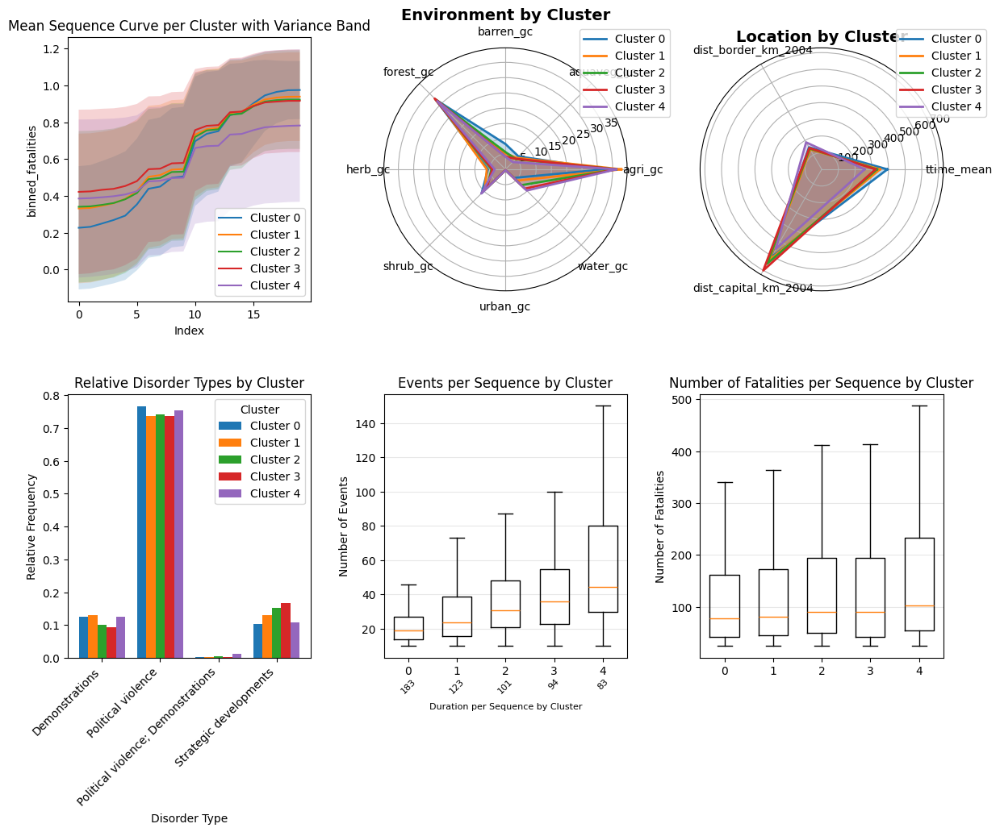

fatalities
Binning completed with 5 clusters
  Cluster 0: 775 sequences (23.1%) range [0.79, 11.25]
  Cluster 1: 603 sequences (18.0%) range [11.25, 18.00]
  Cluster 2: 599 sequences (17.9%) range [18.00, 29.97]
  Cluster 3: 604 sequences (18.0%) range [29.97, 53.35]
  Cluster 4: 771 sequences (23.0%) range [53.35, 35870.50]


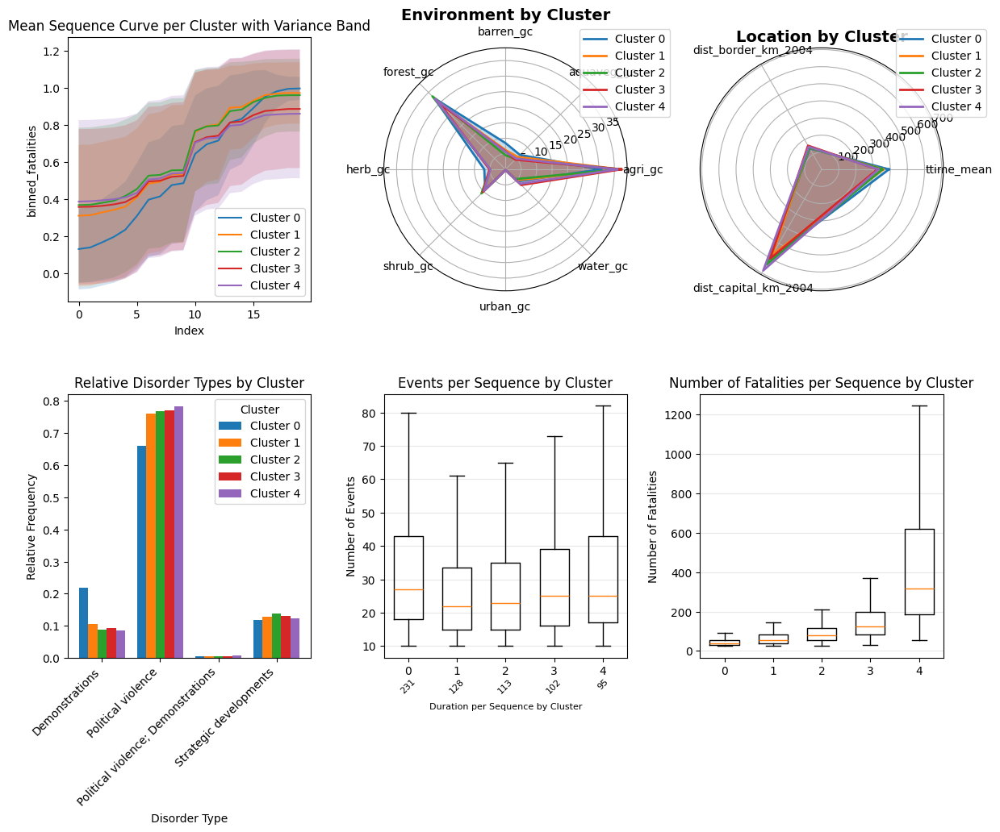

event_id_cnty
Binning completed with 5 clusters
  Cluster 0: 765 sequences (22.8%) range [1.36, 4.17]
  Cluster 1: 606 sequences (18.1%) range [4.17, 5.57]
  Cluster 2: 630 sequences (18.8%) range [5.57, 7.33]
  Cluster 3: 590 sequences (17.6%) range [7.33, 10.50]
  Cluster 4: 761 sequences (22.7%) range [10.50, 102.00]


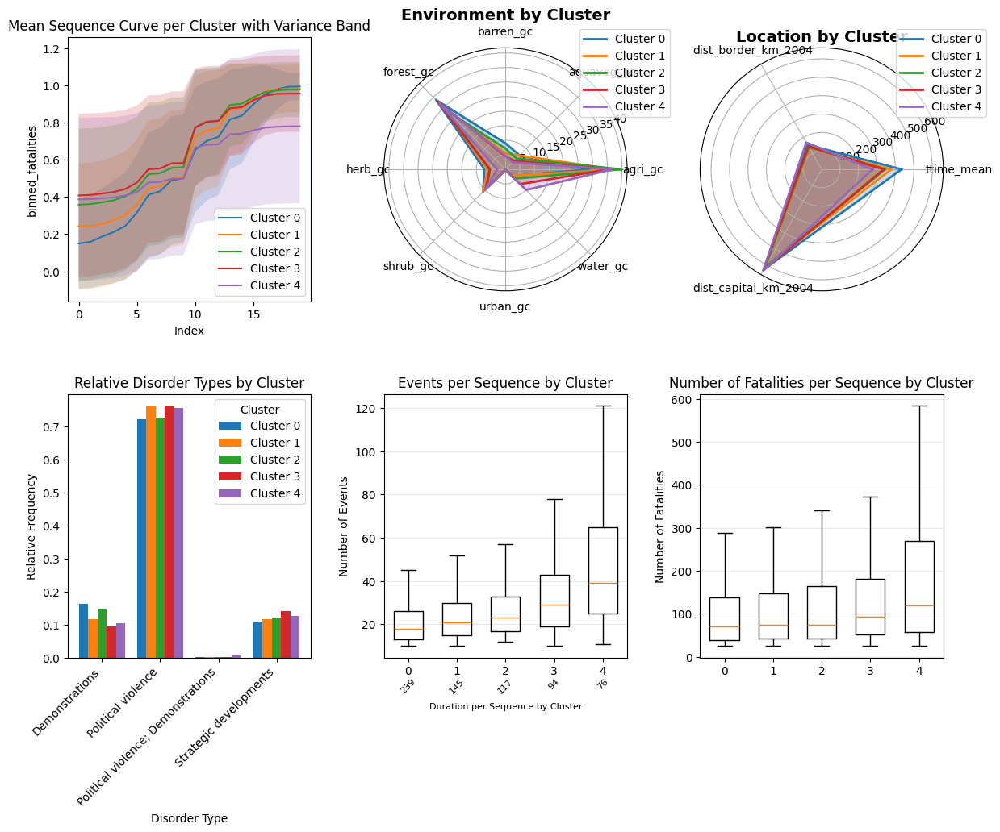

gid
Binning completed with 5 clusters
  Cluster 0: 1162 sequences (34.7%) range [1.00, 1.00]
  Cluster 1: 115 sequences (3.4%) range [1.00, 1.18]
  Cluster 2: 808 sequences (24.1%) range [1.18, 1.50]
  Cluster 3: 481 sequences (14.3%) range [1.50, 1.86]
  Cluster 4: 786 sequences (23.4%) range [1.86, 6.50]


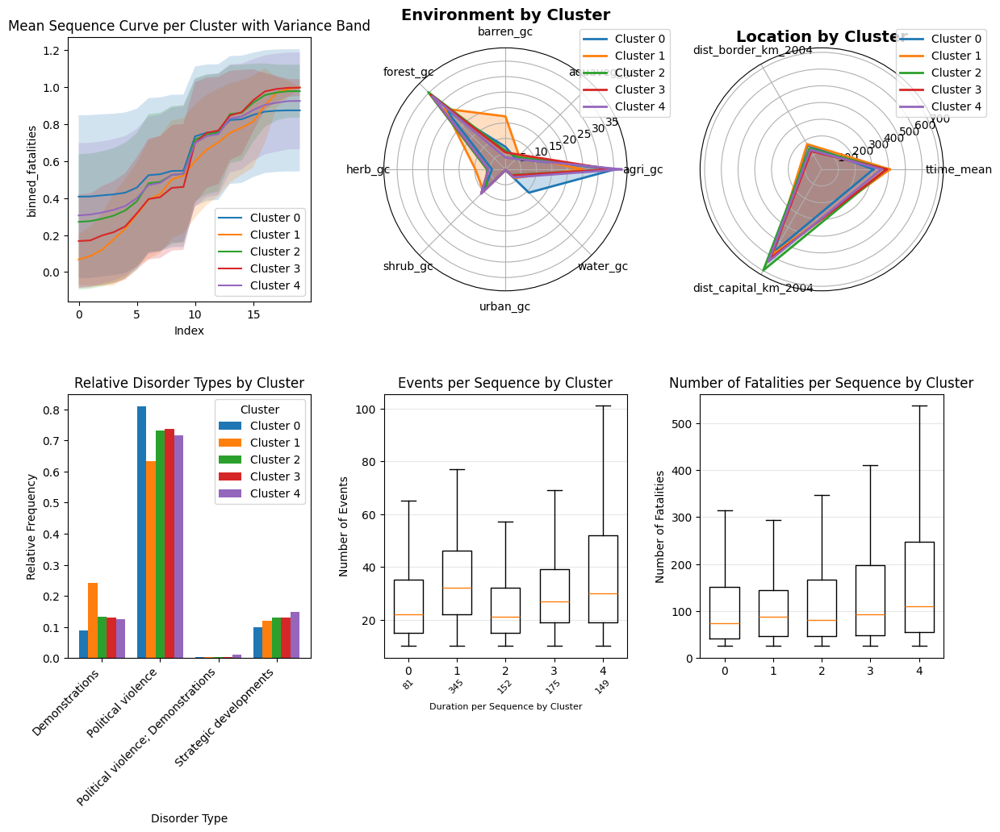

dist_border_km_2004
Binning completed with 5 clusters
  Cluster 0: 772 sequences (23.0%) range [0.98, 45.17]
  Cluster 1: 604 sequences (18.0%) range [45.17, 85.65]
  Cluster 2: 618 sequences (18.4%) range [85.65, 138.60]
  Cluster 3: 590 sequences (17.6%) range [138.60, 240.33]
  Cluster 4: 768 sequences (22.9%) range [240.33, 635.15]


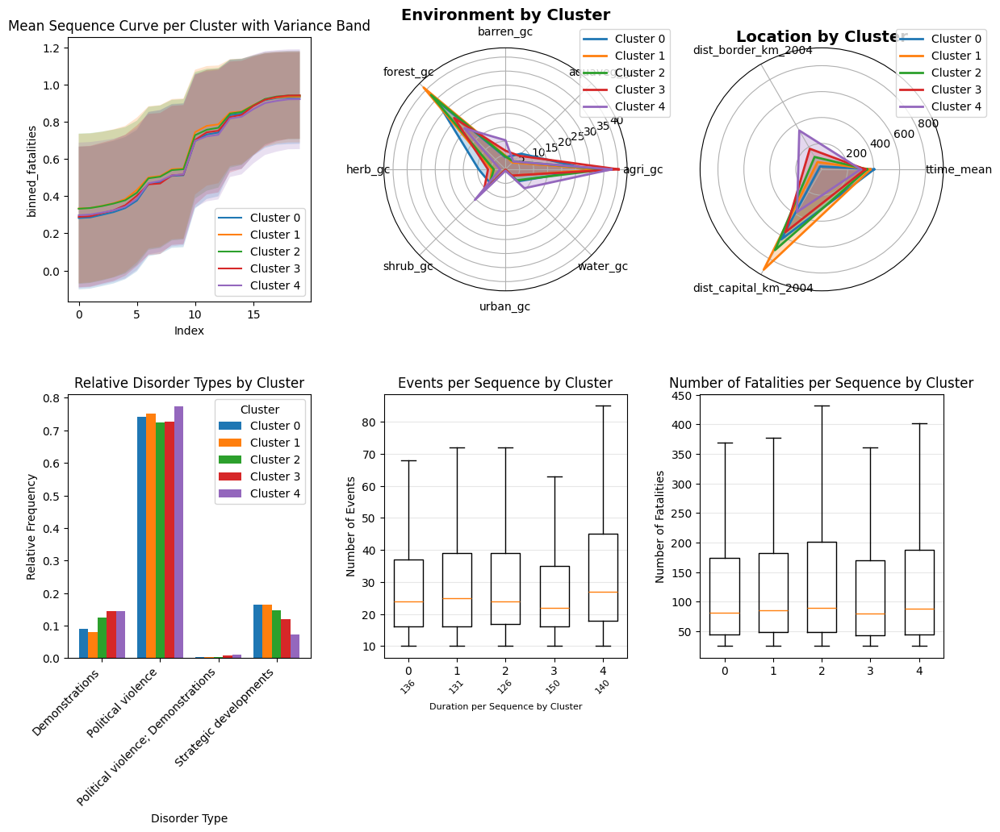

dist_capital_km_2004
Binning completed with 5 clusters
  Cluster 0: 772 sequences (23.0%) range [17.11, 224.11]
  Cluster 1: 604 sequences (18.0%) range [224.11, 363.10]
  Cluster 2: 603 sequences (18.0%) range [363.10, 611.26]
  Cluster 3: 605 sequences (18.0%) range [611.26, 968.29]
  Cluster 4: 768 sequences (22.9%) range [968.29, 1886.18]


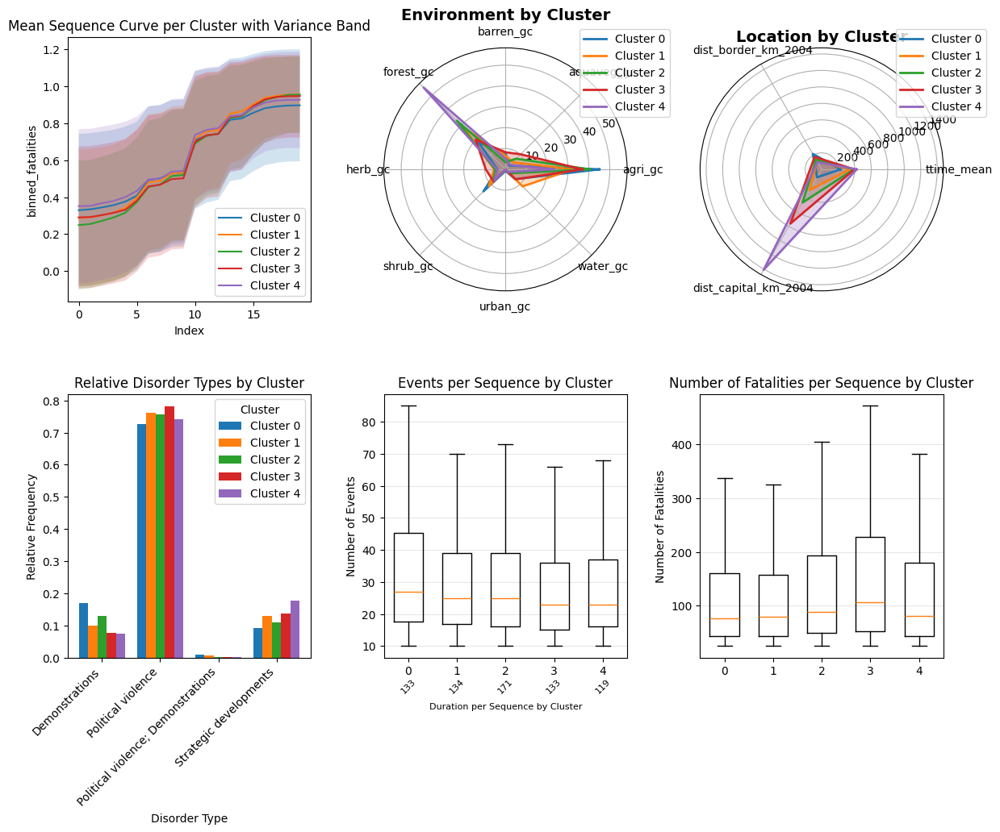

In [36]:
print('dyad')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='dyad', method='uniform')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')
print('fatalities')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='fatalities', method='quantile')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')
print('event_id_cnty')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='event_id_cnty', method='quantile')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')
print('gid')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='gid', method='quantile')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_border_km_2004')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='dist_border_km_2004', method='quantile')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')
print('dist_capital_km_2004')
HDBScan_seq_cluster = build_numeric_feature_cluster(k=k,sequences=HDBScan_seq_cluster, metric='dist_capital_km_2004', method='quantile')
plot_cluster_summary(HDBScan_seq_cluster,'binned_index', 'binned_fatalities')